<p style="font-size:36px;text-align:center"> <b>Personalized cancer diagnosis</b> </p>

<h2>1.3. Real-world/Business objectives and constraints.</h2>

* No low-latency requirement.
* Interpretability is important.
* Errors can be very costly.
* Probability of a data-point belonging to each class is needed.

<h1>2. Machine Learning Problem Formulation</h1>

<h3>2.2.1. Type of Machine Learning Problem</h3>

<p>
    
            There are nine different classes a genetic mutation can be classified into => Multi class classification problem
   
      
    
</p>

<h3>2.2.2. Performance Metric</h3>

Source: https://www.kaggle.com/c/msk-redefining-cancer-treatment#evaluation

Metric(s): 
* Multi class log-loss 
* Confusion matrix 


<h3>2.2.3. Machine Learing Objectives and Constraints</h3>

<p> Objective: Predict the probability of each data-point belonging to each of the nine classes.
</p>
<p> Constraints:
</p>
* Interpretability
* Class probabilities are needed.
* Penalize the errors in class probabilites => Metric is Log-loss.
* No Latency constraints.

## Import necessary packages

In [1]:
# General purpose related packages
import pandas as pd
import numpy as np
import math
import os
import sys

# import Visualization related packages
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

from datetime import datetime
import pickle

from sklearn.manifold import TSNE
from wordcloud import WordCloud


# Data Preprocessing related packages
from nltk.corpus import stopwords
from sklearn.preprocessing import normalize
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Dim reduction related packages
from sklearn.decomposition import TruncatedSVD

# Evaluation metrics related packages
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import log_loss
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import make_scorer

# Model selection related packages
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Model related packages
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from mlxtend.classifier import StackingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import SGDClassifier

from itertools import product

# package for representing results
from prettytable import PrettyTable

# Configs

In [2]:
tf_idf_train_path = './data/TF_IDF_train.csv'
tf_idf_test_path = './data/TF_IDF_test.csv'
res_train_path = './data/Response_Encoded_train.csv'
res_test_path = './data/Response_Encoded_test.csv'
####
bow_train_path = './data/BoW_bigram_train.csv'
bow_test_path = './data/BoW_bigram_test.csv'

sample_size = -1 # set -1  for full size

# Data

## 1) TF-IDF features 

In [3]:
df_train = pd.read_csv(tf_idf_train_path, index_col=False)
df_test = pd.read_csv(tf_idf_test_path, index_col=False)
df_train.head()

,abl1,acvr1,ago2,akt1,akt2,akt3,alk,apc,ar,araf,...,xl,year,years,yeast,yellow,yes,yet,zinc,Label,ID
0,1,0,0,0,0,0,0,0,0,0,...,0.000000,0.000000,0.001538,0.000000,0.000000,0.000000,0.011090,0.00000,7,837
1,0,0,0,0,0,0,0,0,0,0,...,0.002491,0.000000,0.001459,0.015967,0.003912,0.000000,0.002629,0.02184,1,493
2,0,0,0,0,1,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.012576,0.000000,0.000000,0.00000,7,1376
3,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2,3283
4,0,0,0,0,0,0,0,0,0,0,...,0.004610,0.043546,0.021592,0.000000,0.003620,0.026814,0.000000,0.00000,7,2708


In [4]:
if (sample_size > 0):
    df_train = df_train.groupby(['Label']).apply(lambda x : 
                    x.sample(n=min(x.shape[0], sample_size )))
    df_train = df_train.reset_index(drop=True)
    df_test = df_test.groupby(['Label']).apply(lambda x : 
                    x.sample(n=min(x.shape[0], sample_size )))
    df_test = df_test.reset_index(drop=True)

# split the data to features & labels
X_train  = df_train.drop(['ID', 'Label'], axis=1)
y_train = df_train['Label']

# Evaluate the model on Test data
X_test = df_test.drop(['ID', 'Label'], axis=1)
y_test = df_test['Label']

print('Shape of train df', df_train.shape)
print('Shape of test df', df_test.shape)

feat_names_list = X_train.columns.values.tolist()

Shape of train df (2324, 5369)
Shape of test df (997, 5369)


# UTIL Functions

In [5]:
def plot_word_cloud(dictionary, max_words, suff_name=str()):
    """
    This function plots the feature importance
    """
    wc = WordCloud(background_color="white",width=600,height=600, 
                   max_words=max_words,relative_scaling=0.5,
                   normalize_plurals=False).generate_from_frequencies(dictionary)
    plt.figure(figsize = (6, 6), facecolor = None)  
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.imshow(wc)
    plt.title('Feature Importance - Class : ' + suff_name)
    plt.show()
    plt.close()

In [6]:
def get_feature_importance(model, num_features, feat_names_list):
    
    # declare the number of columns
    num_classess = 9
    
    # declare a min max scaler
    mm_scaler=  MinMaxScaler()
    
    # get coefficient array
    coeficient_array = model.coef_.T
    mm_scaler.fit(coeficient_array)
    
    # create a coeficient data frame
    coef_df = pd.DataFrame(mm_scaler.transform(coeficient_array))
    # add feature column
    coef_df['Feature'] = feat_names_list
    
    for class_index in range(0,num_classess):
        # create a data frmae for this class
        temp_df = coef_df[['Feature', class_index]]
        temp_df = temp_df.sort_values([class_index], ascending=False)
        temp_df = temp_df.iloc[0:num_features]
        # form an importance dictionary
        imp_dict = dict(zip(temp_df['Feature'], temp_df[class_index]))
        
        # plot importance for this class
        plot_word_cloud(imp_dict, num_features, suff_name=str(class_index))
        print('\n'*2)

In [7]:
def plot_rf_feat_importance(forest, feat_names_list):
    
    num_features = 20
    
    importances = forest.feature_importances_
    std = np.std([tree.feature_importances_ for tree in forest.estimators_],
                 axis=0)
    
    # get top 5 features
    indices = np.argsort(importances)[::-1]
    indices = indices[0:num_features]
    indices_names = [feat_names_list[index] for index in indices]

    # Print the feature ranking
    #print("Feature ranking:")

    #for f in range(X.shape[1]):
    #    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

    # Plot the feature importances of the forest
    plt.figure()
    plt.title("Feature importances")
    plt.bar(range(num_features), importances[indices],
           color="r", yerr=std[indices], align="center")
    plt.xticks(range(num_features), indices_names)
    plt.xticks(rotation=90)
    plt.xlim([-1, num_features])
    plt.xlabel('Features')
    plt.ylabel('Importance')
    plt.show()
    plt.close()

In [8]:
def get_confusion_matrix(actual_list, predicted_list, title_suffix=str(), plot_fig=True):
    """
    This function plots the confusion matrix given ground truth and predicted
    """
    
    conf_matrix = confusion_matrix(actual_list, predicted_list, labels=class_labels_list)
    
    col_names = class_labels_list
    conf_df = pd.DataFrame(conf_matrix, columns=class_labels_list)
    conf_df.index = class_labels_list
    
    if plot_fig:
        plt.figure(figsize=(20,7))

        # plot confusion matrix
        sns.heatmap(conf_df, annot=True, annot_kws={'size': 16}, fmt='g', cmap='YlGnBu',
                       cbar_kws={'label': 'prediction_count', 'format':'%d'})
        plt.yticks(rotation=0)
        plt.xticks(rotation=90)
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.title('Confusion Matrix -' + title_suffix)
        plt.show()
        plt.close()
    
    return conf_df

In [9]:
def get_precision_recall_matrix(conf_matrix, title_suffix=str(), plot_fig=True):
    
    # compute precision matrix
    precision_matrix = conf_matrix.div(conf_matrix.sum(axis=0), axis=1) * 100.0
    
    # compute recall matrix
    recall_matrix = conf_matrix.div(conf_matrix.sum(axis=1), axis=0) * 100.0

    
    # plot precision matrix
    if plot_fig:
        plt.figure(figsize=(20,7))
        sns.heatmap(precision_matrix, annot=True, annot_kws={'size': 16}, fmt='.4f', cmap='YlGnBu',
                       cbar_kws={'label': 'percentage', 'format':'%.2f'})
        plt.yticks(rotation=0)
        plt.xticks(rotation=90)
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.title('Precision Matrix -' + title_suffix)
        plt.show()
        plt.close()

        # plot recall matrix
        plt.figure(figsize=(20,7))
        sns.heatmap(recall_matrix, annot=True, annot_kws={'size': 16}, fmt='.4f', cmap='YlGnBu',
                       cbar_kws={'label': 'percentage', 'format':'%.2f'})
        plt.yticks(rotation=0)
        plt.xticks(rotation=90)
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.title('Recall Matrix -' + title_suffix)
        plt.show()
        plt.close()
    
    # return as a tuple
    return (precision_matrix, recall_matrix,)

In [10]:
def get_classification_report(actual, predicted, title_suffix=str(), plot_fig=True):
    
    # set class labels and its corresponding name
    col_names = class_labels_list
    
    # compute performance df
    eval_matrix = precision_recall_fscore_support(actual, predicted, 
                                                  labels=class_labels_list)
    
    eval_df = pd.DataFrame(list(eval_matrix), columns=class_labels_list)
    eval_df.index = ['Precision', 'Recall', 'Fscore', 'Support']
    eval_df.columns = col_names
    
    
    # normalize the performace df
    eval_df_normed = eval_df * 100.0
    eval_df_normed.loc['Support', col_names] /= eval_df_normed.loc['Support', col_names].sum()
    eval_df_normed.iloc[3:4, :] *= 100.0
    
    # plot the classification report
    if plot_fig:
        plt.figure(figsize=(20,7))
        sns.heatmap(eval_df_normed, annot=True, annot_kws={'size': 16}, fmt='.4f', cmap='YlGnBu',
                       cbar_kws={'label': 'Percentage', 'format':'%.2f'})
        plt.yticks(rotation=0)
        plt.xticks(rotation=90)

        plt.xlabel('Classes')
        plt.ylabel('Metrics')
        plt.title('Classification Report -' + title_suffix)
        plt.show()
        plt.close()
    
    return eval_df_normed

In [11]:
def evaluate_model(model, X, y, title_suffix=str(), plot_fig=True):
    
    # get prediction and its probability
    predicted_labels = model.predict(X)
    predicted_probs = model.predict_proba(X)
    
    # get confsuion matrix
    conf_matrix = get_confusion_matrix(y, predicted_labels, 
                                       title_suffix=title_suffix,
                                       plot_fig=plot_fig) 
    
    # get precision & recall matrix
    pre_matrix, recall_matrix = get_precision_recall_matrix(conf_matrix, 
                                                            title_suffix=title_suffix,
                                                            plot_fig=plot_fig)
    
    # get classification report
    clf_report = get_classification_report(y, predicted_labels,
                                           title_suffix=title_suffix,
                                           plot_fig=plot_fig)

    # compute log loss
    log_loss_val = log_loss(y, predicted_probs, labels=class_labels_list, 
                            eps=1e-15)
    print('Test Log loss value : ', log_loss_val)
    
    # round off to 4 decimal places
    log_loss_val = round(log_loss_val, 4)
    
    # prepare the pretty table entry
    table_entry = (log_loss_val,)
    
    return table_entry

<h1>4. Machine Learning Models</h1>

In [12]:
num_clasess = 9
class_labels_list = list(range(1, num_clasess + 1))
#class_names_list =

<h2>4.1. Base Line Model</h2>

### KNN - Classifier

In [13]:
def get_best_hyperparam_KNN_Classifier(param_dict, X, y, random_search=False):
    
    # set the scoring function
    final_scorer = 'log_loss'

    # declare a scoring dictionary
    score_dict = {
        'log_loss': make_scorer(score_func=log_loss, greater_is_better=False,
                                needs_proba=True, needs_threshold=False,
                                labels=class_labels_list)
    }


    #Declare the metric as  'minimization' or 'maximization'
    optimization_dict = {
        'log_loss' : 'minimization'
       }
    
    
    # Time Series split
    # cv_data = TimeSeriesSplit(n_splits=3)
    cv_data = 3
        
     
    # declare model
    model = KNeighborsClassifier()
    
    if random_search:
        search_cv = RandomizedSearchCV(estimator=model, param_distributions=param_dict, 
                                       cv=cv_data, scoring=score_dict, refit=False, 
                                       return_train_score=True, n_iter=6, n_jobs=-1)
        
    else:
        # declare grid search CV object
        search_cv = GridSearchCV(estimator=model, param_grid=param_dict, cv=cv_data,
                                 scoring=score_dict, refit=False, 
                                 return_train_score=True, n_jobs=-1)
    
    # fit to the data
    search_cv.fit(X, y)
    
    
    # get total number of param settings
    param_list = list(param_dict.keys())
    param_field_list = ['param_' + item for item in param_list]
    
    # get list of train metric list
    train_metric_list = ['mean_train_' + item for item in score_dict.keys()]
    # get list of test metric list
    test_metric_list = ['mean_test_' + item for item in score_dict.keys()]
    
    # get number of rows in the search cv data frame
    num_rows = len(search_cv.cv_results_['params'])
        
    # create the grid search info df  
    grid_info_df = pd.DataFrame(search_cv.cv_results_, index=range(num_rows))
    
    # prepare a list of reqired columns
    required_columns = ['params'] + param_field_list + train_metric_list + \
                       test_metric_list
    
    # slice the data frame to only required columns
    grid_info_df = grid_info_df[required_columns]
    
    # process individual metrics
    for metric, optimization in optimization_dict.items():
        if optimization == 'minimization':
            grid_info_df['mean_train_' + metric] *= -1
            grid_info_df['mean_test_' + metric] *= -1
            
    # Find the best hyperparam & its corresponding scores
    if optimization_dict[final_scorer] == 'minimization':
        best_hyperparam_record = grid_info_df.loc[grid_info_df[
                                   'mean_test_'+ final_scorer].idxmin(),:] 
    else:
        best_hyperparam_record = grid_info_df.loc[grid_info_df[
                                   'mean_test_'+ final_scorer].idxmax(),:]
        
    # best hyperparam & corresponding scores
    best_hyperparam = best_hyperparam_record['params']
    best_train_score = best_hyperparam_record['mean_train_'+ final_scorer]
    best_validation_score = best_hyperparam_record['mean_test_'+ final_scorer]
    
    # plot the hyper params 
    if len(param_list) == 1:
        
        # extract individual fiedls
        x_vals = grid_info_df[param_field_list[0]].tolist()
        y_vals_tr = grid_info_df['mean_train_' + final_scorer].tolist()
        y_vals_val = grid_info_df['mean_test_' + final_scorer].tolist()
        
        # plot train, validation performances
        plt.plot(x_vals, y_vals_tr, label='Train', color='r', marker='o', linestyle='-')
        plt.plot(x_vals, y_vals_val, label='Validation', color='b', marker='o', linestyle='-')
        plt.xlabel('Hyper Params -' + param_list[0])
        plt.ylabel(final_scorer)
        plt.legend()
        plt.title('KNN Classifier - Hyperparam Train v/s Validation Scores')
        plt.show()
        plt.close()
        
        
    # Heatmap plot for pair of hyperparam values  
    elif len(param_list) == 2:
        # get pivoted table
        train_hyp_df = pd.pivot_table(data=grid_info_df, index=param_field_list[0], 
                                      columns=param_field_list[1],
                                      values='mean_train_' + final_scorer , 
                                      fill_value=np.inf)
        sns.heatmap(train_hyp_df, annot=True, cmap='YlGnBu', fmt='.4f',
                   cbar_kws={'label': final_scorer, 'format':'%.2f'})
        plt.xlabel(param_list[1])
        plt.ylabel(param_list[0])
        plt.title('KNN Classifier - Hyperparams Scores - Train')
        plt.show()
        plt.close()
        
        print('\n'*3)
        
        # Test hyperparam
        
        # get pivoted table
        train_hyp_df = pd.pivot_table(data=grid_info_df, index=param_field_list[0], 
                                      columns=param_field_list[1],
                                      values='mean_test_' + final_scorer, fill_value=np.inf)
        sns.heatmap(train_hyp_df, annot=True, cmap='YlGnBu', fmt='.4f',
                   cbar_kws={'label': final_scorer, 'format':'%.2f'})
        plt.xlabel(param_list[1])
        plt.ylabel(param_list[0])
        plt.title('KNN Classifier - Hyperparams Scores - Validation')
        plt.show()
        plt.close()
    else:
        print(grid_info_df)
    
    print('Best hyperparam value: ', best_hyperparam, 'Best Train Score: ', best_train_score, 
          'Best Validation Score: ', best_validation_score)
   
          
    #best_mse_train = best_hyperparam_record['mean_train_MSE']
    #best_mse_validation = best_hyperparam_record['mean_test_MSE']
    
    # return tuple
    ret_tuple = (best_hyperparam, best_train_score, best_validation_score,)
    
    
    return ret_tuple

### Step 1. Find the best hyperparm values

2019-06-28 14:28:42.111912  Hyperparam Tuning of KNN started


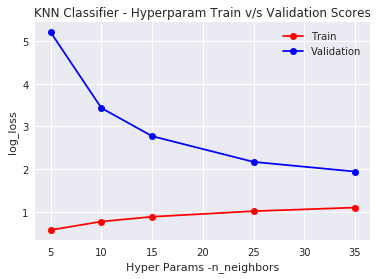

Best hyperparam value:  {'n_neighbors': 35} Best Train Score:  1.1001860170092332 Best Validation Score:  1.94407691269412
2019-06-28 14:32:00.507889  Hyperparam Tuning of XGB completed


In [14]:
print(datetime.now() ,' Hyperparam Tuning of KNN started')
param_dict_knn = {'n_neighbors':[5, 10, 15, 25, 35]}
hyp_tuned_info_knn = get_best_hyperparam_KNN_Classifier(param_dict_knn, X_train, y_train)
print(datetime.now() ,' Hyperparam Tuning of XGB completed')

# separate out the fields
knn_best_hyp, knn_best_tr_score, knn_best_val_score = hyp_tuned_info_knn

In [15]:
knn_clf = KNeighborsClassifier(n_neighbors=knn_best_hyp['n_neighbors'])
calib_knn_clf = CalibratedClassifierCV(base_estimator=knn_clf, 
                                       method='sigmoid', cv=3)

### Step 2. Train the model with best hyperparam value

In [16]:
calib_knn_clf.fit(X_train, y_train)

# save model to disk
pickle_out = open("./model/knn_clf.pkl","wb")
pickle.dump(calib_knn_clf, pickle_out)
pickle_out.close()


In [17]:
#load model from disk
pickle_in = open("./model/knn_clf.pkl","rb")
calib_knn_clf = pickle.load(pickle_in)
pickle_in.close()


table_entry_knn_train = evaluate_model(calib_knn_clf, X_train, y_train, 
                                       title_suffix='Train',
                                       plot_fig=False)

Test Log loss value :  1.1816003815727874


### Step 3. Evaluate the model on test data

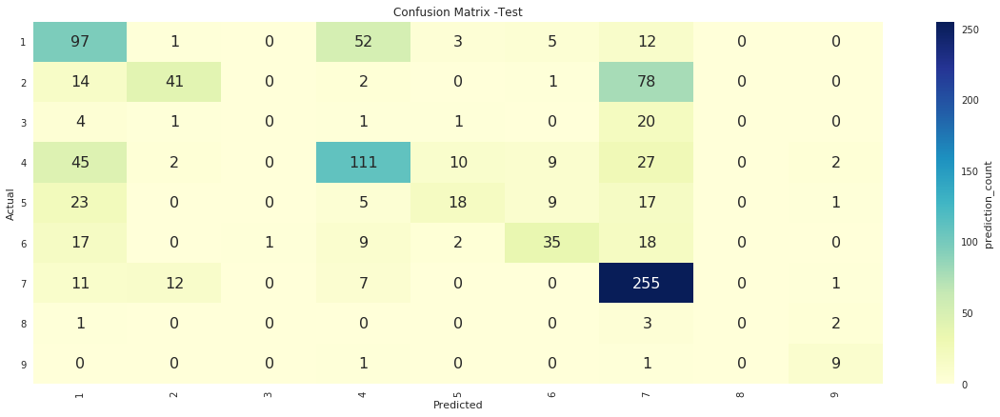

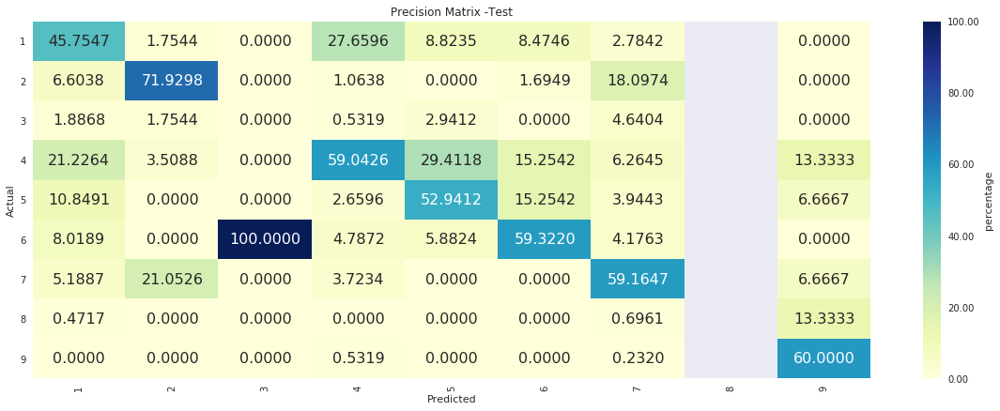

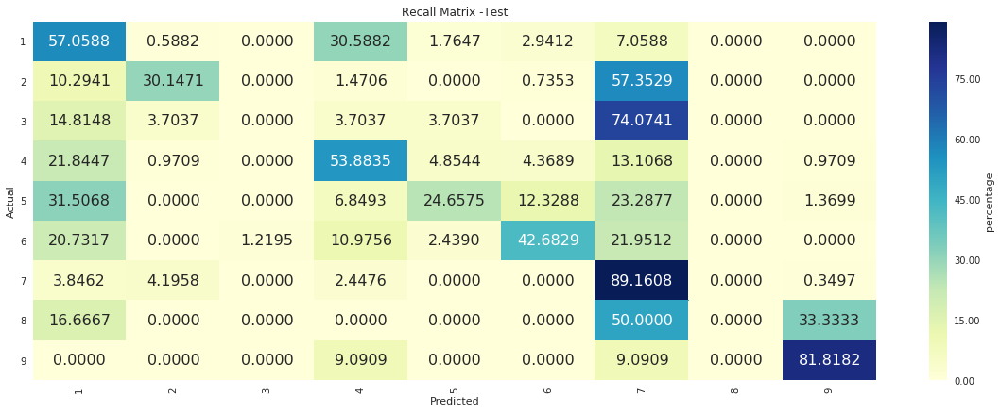

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


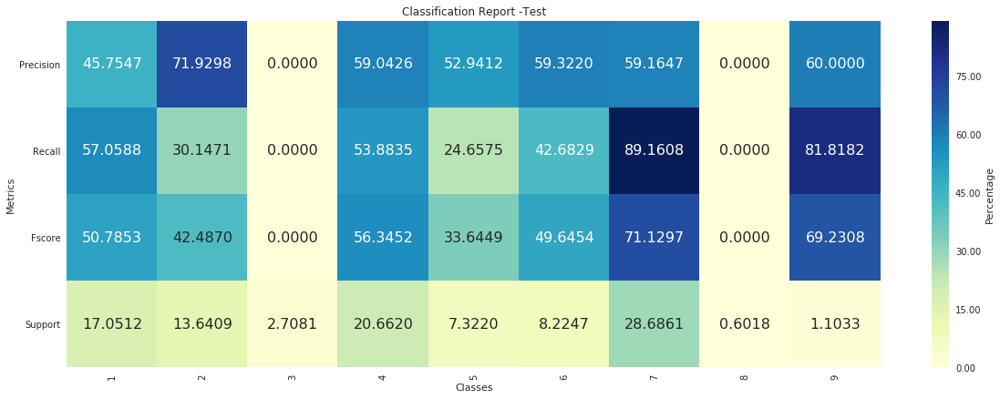

Test Log loss value :  1.2404248616947493


In [18]:
table_entry_knn_test = evaluate_model(calib_knn_clf, X_test, y_test, 
                                      title_suffix='Test', 
                                      plot_fig=True)

In [19]:
table_entry_knn = ('KNN', knn_best_hyp,)  + table_entry_knn_train + table_entry_knn_test

<h3> Observations </h3>
<ul>
<li> As the K -value increases model tends to show decerase in log loss </li>
<li> From confusion matrix, precision, recall matrix, Model performed well in predicting class 7, 9
     with 81+ percenage </li>
<li> Model showed poor performance on rare class 3 0.0% precision & recall </li>
</ul>

<h3>4.1.1. Naive Bayes</h3>

In [20]:
def get_best_hyperparam_NaiveBayesClassifier(param_dict, X, y, random_search=False):
     
    # set the scoring function
    final_scorer = 'log_loss'
    
    # declare a scoring dictionary
    score_dict = {
        'log_loss': make_scorer(score_func=log_loss, greater_is_better=False,
                               needs_proba=True, needs_threshold=False,
                               labels=class_labels_list)
    }
        
    
     #Declare the metric as  'minimization' or 'maximization'
    optimization_dict = {
        'log_loss' : 'minimization'
    }
    
    
    # Time Series split
    # cv_data = TimeSeriesSplit(n_splits=3)
    cv_data = 3
        
     
    # declare model
    model = MultinomialNB()
    
    if random_search:
        search_cv = RandomizedSearchCV(estimator=model, param_distributions=param_dict, 
                                       cv=cv_data, scoring=score_dict, refit=False, 
                                       return_train_score=True, n_iter=6, n_jobs=-1)
        
    else:
        # declare grid search CV object
        search_cv = GridSearchCV(estimator=model, param_grid=param_dict, cv=cv_data,
                                 scoring=score_dict, refit=False, 
                                 return_train_score=True, n_jobs=-1)
    
    # fit to the data
    search_cv.fit(X, y)
    
    
    # get total number of param settings
    param_list = list(param_dict.keys())
    param_field_list = ['param_' + item for item in param_list]
    
    # get list of train metric list
    train_metric_list = ['mean_train_' + item for item in score_dict.keys()]
    # get list of test metric list
    test_metric_list = ['mean_test_' + item for item in score_dict.keys()]
    
    # get number of rows in the search cv data frame
    num_rows = len(search_cv.cv_results_['params'])
        
    # create the grid search info df  
    grid_info_df = pd.DataFrame(search_cv.cv_results_, index=range(num_rows))
    
    # prepare a list of reqired columns
    required_columns = ['params'] + param_field_list + train_metric_list + \
                       test_metric_list
    
    # slice the data frame to only required columns
    grid_info_df = grid_info_df[required_columns]
    
    # process individual metrics
    for metric, optimization in optimization_dict.items():
        if optimization == 'minimization':
            grid_info_df['mean_train_' + metric] *= -1
            grid_info_df['mean_test_' + metric] *= -1
            
    # Find the best hyperparam & its corresponding scores
    if optimization_dict[final_scorer] == 'minimization':
        best_hyperparam_record = grid_info_df.loc[grid_info_df[
                                   'mean_test_'+ final_scorer].idxmin(),:] 
    else:
        best_hyperparam_record = grid_info_df.loc[grid_info_df[
                                   'mean_test_'+ final_scorer].idxmax(),:]
        
    # best hyperparam & corresponding scores
    best_hyperparam = best_hyperparam_record['params']
    best_train_score = best_hyperparam_record['mean_train_'+ final_scorer]
    best_validation_score = best_hyperparam_record['mean_test_'+ final_scorer]
    
    # plot the hyper params 
    if len(param_list) == 1:
        
        # extract individual fiedls
        x_vals = np.log10(grid_info_df[param_field_list[0]].tolist())
        y_vals_tr = grid_info_df['mean_train_' + final_scorer].tolist()
        y_vals_val = grid_info_df['mean_test_' + final_scorer].tolist()
        
        # plot train, validation performances
        plt.plot(x_vals, y_vals_tr, label='Train', color='r', marker='o', linestyle='-')
        plt.plot(x_vals, y_vals_val, label='Validation', color='b', marker='o', linestyle='-')
        plt.xlabel('Log Hyper Params -' + param_list[0])
        plt.ylabel(final_scorer)
        plt.legend()
        plt.title('MNB Classifier - Hyperparam Train v/s Validation Scores')
        plt.show()
        
        
    # Heatmap plot for pair of hyperparam values  
    elif len(param_list) == 2:
        # get pivoted table
        train_hyp_df = pd.pivot_table(data=grid_info_df, index=param_field_list[0], 
                                      columns=param_field_list[1],
                                      values='mean_train_' + final_scorer , 
                                      fill_value=np.inf)
        sns.heatmap(train_hyp_df, annot=True, cmap='YlGnBu', fmt='.4f',
                   cbar_kws={'label': final_scorer, 'format':'%.2f'})
        plt.xlabel(param_list[1])
        plt.ylabel(param_list[0])
        plt.title('NB Classifier - Hyperparams Scores - Train')
        plt.show()
        
        print('\n'*3)
        
        # Test hyperparam
        
        # get pivoted table
        train_hyp_df = pd.pivot_table(data=grid_info_df, index=param_field_list[0], 
                                      columns=param_field_list[1],
                                      values='mean_test_' + final_scorer, fill_value=np.inf)
        sns.heatmap(train_hyp_df, annot=True, cmap='YlGnBu', fmt='.4f',
                   cbar_kws={'label': final_scorer, 'format':'%.2f'})
        plt.xlabel(param_list[1])
        plt.ylabel(param_list[0])
        plt.title('NB Classifier - Hyperparams Scores - Validation')
        plt.show()
        
    else:
        print(grid_info_df)
    
    print('Best hyperparam value: ', best_hyperparam, 'Best Train Score: ', best_train_score, 
          'Best Validation Score: ', best_validation_score)
   
          
    #best_mse_train = best_hyperparam_record['mean_train_MSE']
    #best_mse_validation = best_hyperparam_record['mean_test_MSE']
    
    # return tuple
    ret_tuple = (best_hyperparam, best_train_score, best_validation_score,)
    
    
    return ret_tuple

### Step 1. Find the best hyperparm values

2019-06-28 14:37:57.867643  Hyperparam Tuning of MNB started


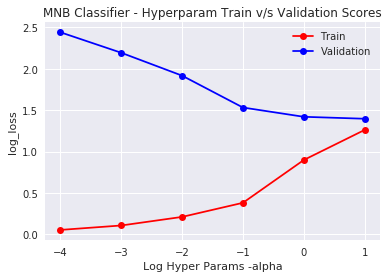

Best hyperparam value:  {'alpha': 10.0} Best Train Score:  1.2620859328724467 Best Validation Score:  1.3967926465745313
2019-06-28 14:38:01.655276  Hyperparam Tuning of MNB completed


In [21]:
param_dict_nb = {'alpha':[1e-04, 1e-03, 1e-02, 1e-01, 1e-0, 1e+1]}

print(datetime.now() ,' Hyperparam Tuning of MNB started')
hyp_tuned_info_nb = get_best_hyperparam_NaiveBayesClassifier(param_dict_nb, X_train, y_train)
print(datetime.now() ,' Hyperparam Tuning of MNB completed')

# separate out the fields
nb_best_hyp, nb_best_tr_score, nb_best_val_score = hyp_tuned_info_nb

In [22]:
mnb_clf = MultinomialNB(alpha=nb_best_hyp['alpha'])
calib_mnb_clf = CalibratedClassifierCV(base_estimator=mnb_clf, 
                                       method='sigmoid', cv=3)

### Step 2. Train the model with best hyperparam value

In [23]:
# fit to data
mnb_clf.fit(X_train, y_train)
calib_mnb_clf.fit(X_train, y_train)

# save model to disk
pickle_out = open("./model/mnb_clf.pkl","wb")
pickle.dump(calib_mnb_clf, pickle_out)
pickle_out.close()

In [24]:
pickle_in = open("./model/mnb_clf.pkl","rb")
calib_mnb_clf = pickle.load(pickle_in)
pickle_in.close()

table_entry_mnb_train = evaluate_model(calib_mnb_clf, X_test, y_test,
                                     title_suffix='Train',
                                     plot_fig=False)

Test Log loss value :  1.24645339448244


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Step 3. Evaluate the model on test data

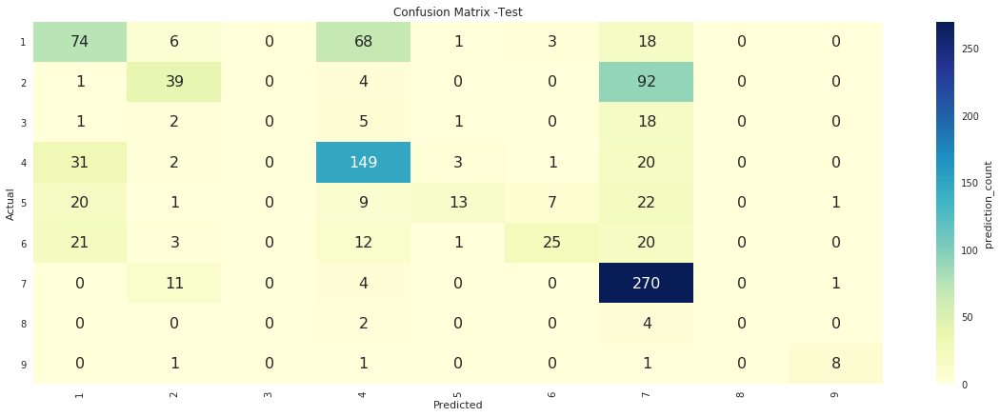

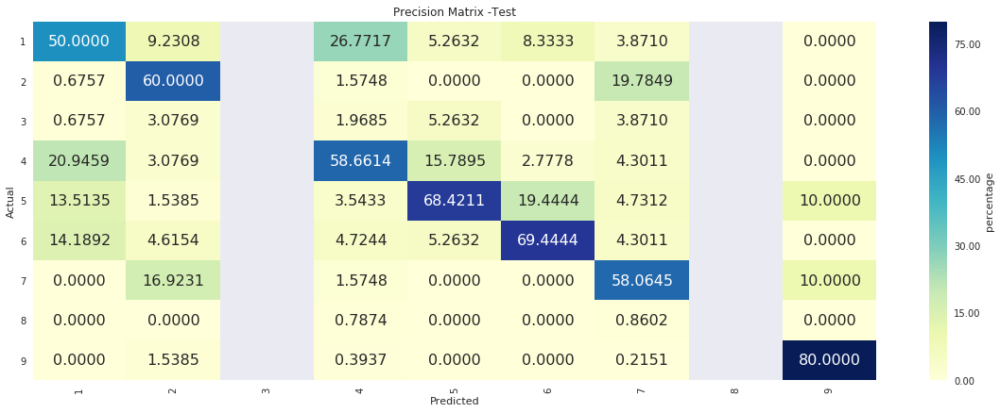

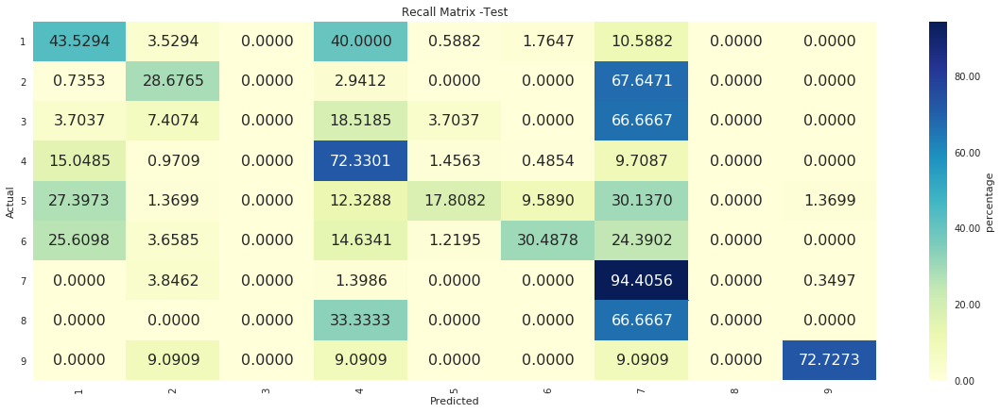

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


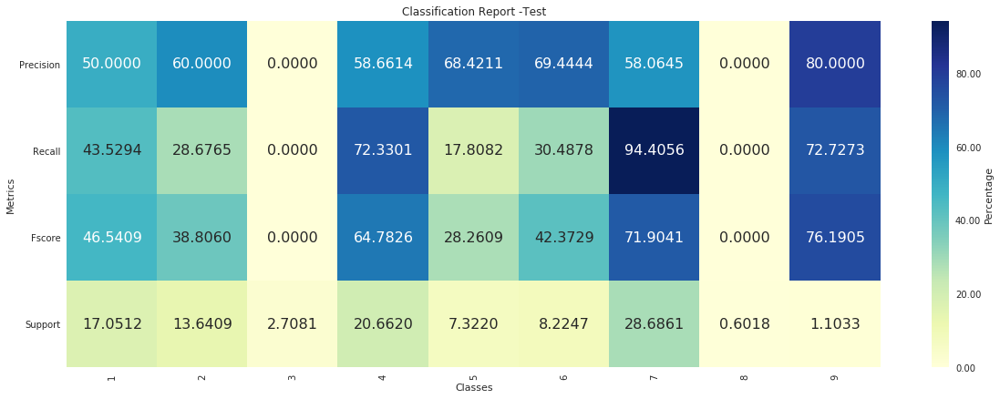

Test Log loss value :  1.24645339448244


In [25]:
table_entry_mnb_test = evaluate_model(calib_mnb_clf, X_test, y_test,
                                     title_suffix='Test',
                                     plot_fig=True)

In [26]:
mnb_table_entry = ('Multinomial-NB', nb_best_hyp,) + table_entry_mnb_train + table_entry_mnb_test

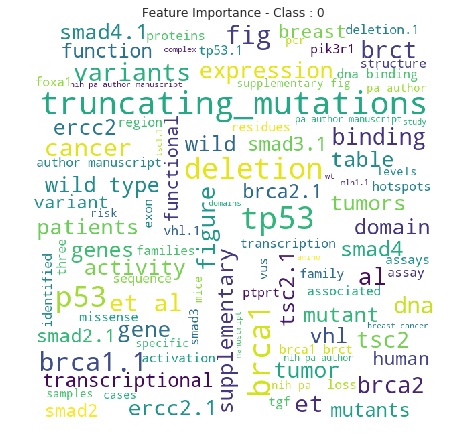

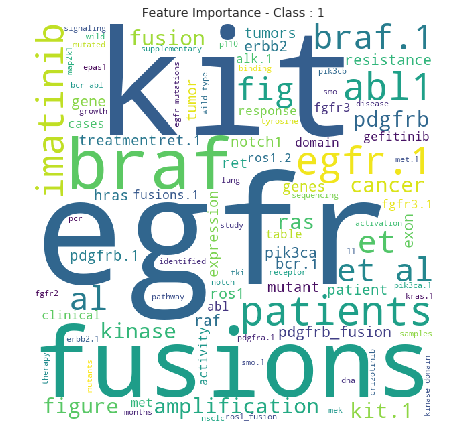

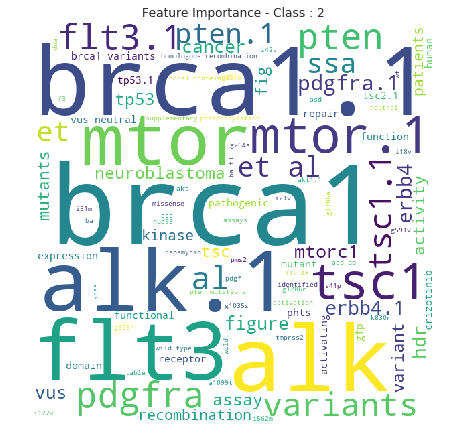

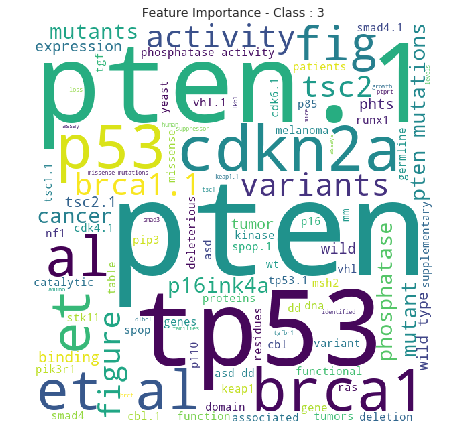

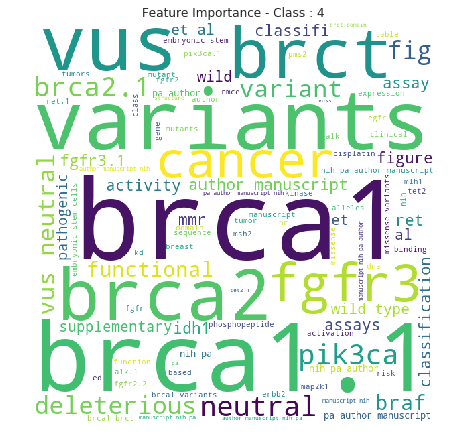

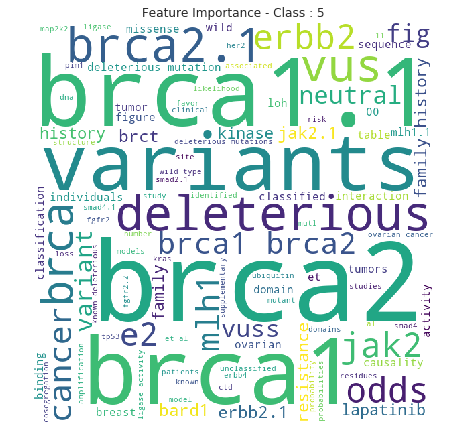

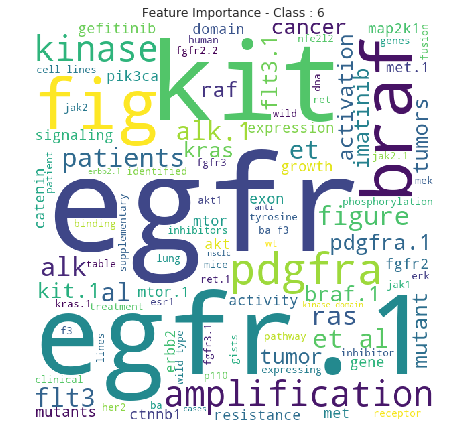

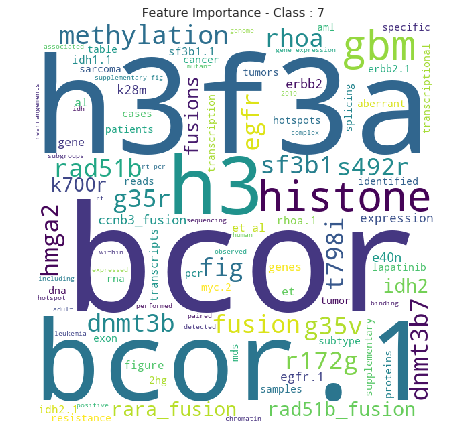

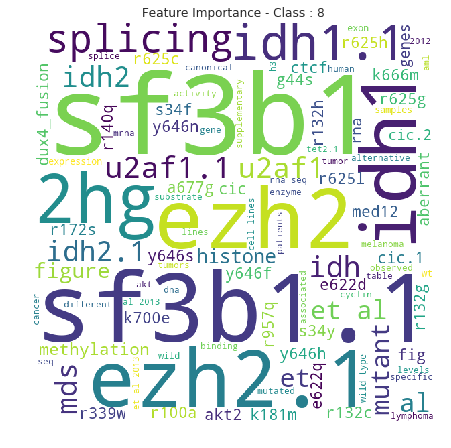

In [27]:
get_feature_importance(mnb_clf, 100, feat_names_list)

<h3> Observations </h3>
<ul>
<li> As the alpha value increases train log loss tends to increase and validation 
     log loss tends to decerase </li>
<li> From confusion matrix, precision, recall matrix, Model performed well in predicting class 7, 9
     with 72+  percenage f-score</li>
<li> Model showed poor performance on rare class 3 & 8 (0.0% precision & recall) </li>
<li> Feture importances are shown in the wordcloud representation </li>
</ul>

<h2>4.3. Logistic Regression</h2>

In [28]:
def get_best_hyperparam_LogisticRegression(param_dict, X, y, random_search=False, balanced=False):
    
    # set the scoring function
    final_scorer = 'log_loss'

    # declare a scoring dictionary
    score_dict = {
        'log_loss': make_scorer(score_func=log_loss, greater_is_better=False,
                                needs_proba=True, needs_threshold=False,
                                labels=class_labels_list)
            }


    #Declare the metric as  'minimization' or 'maximization'
    optimization_dict = {
        'log_loss' : 'minimization'
       }
    
    # Time Series split
    # cv_data = TimeSeriesSplit(n_splits=3)
    cv_data = 3
        
     
    # declare model
    if balanced:
        model = LogisticRegression(class_weight='balanced')
    else:
        model = LogisticRegression()
    
    if random_search:
        search_cv = RandomizedSearchCV(estimator=model, param_distributions=param_dict, 
                                       cv=cv_data, scoring=score_dict, refit=False, 
                                       return_train_score=True, n_iter=6, n_jobs=-1)
        
    else:
        # declare grid search CV object
        search_cv = GridSearchCV(estimator=model, param_grid=param_dict, cv=cv_data,
                                 scoring=score_dict, refit=False, 
                                 return_train_score=True, n_jobs=-1)
    
    # fit to the data
    search_cv.fit(X, y)
    
    
    # get total number of param settings
    param_list = list(param_dict.keys())
    param_field_list = ['param_' + item for item in param_list]
    
    # get list of train metric list
    train_metric_list = ['mean_train_' + item for item in score_dict.keys()]
    # get list of test metric list
    test_metric_list = ['mean_test_' + item for item in score_dict.keys()]
    
    # get number of rows in the search cv data frame
    num_rows = len(search_cv.cv_results_['params'])
        
    # create the grid search info df  
    grid_info_df = pd.DataFrame(search_cv.cv_results_, index=range(num_rows))
    
    # prepare a list of reqired columns
    required_columns = ['params'] + param_field_list + train_metric_list + \
                       test_metric_list
    
    # slice the data frame to only required columns
    grid_info_df = grid_info_df[required_columns]
    
    # process individual metrics
    for metric, optimization in optimization_dict.items():
        if optimization == 'minimization':
            grid_info_df['mean_train_' + metric] *= -1
            grid_info_df['mean_test_' + metric] *= -1
            
    # Find the best hyperparam & its corresponding scores
    if optimization_dict[final_scorer] == 'minimization':
        best_hyperparam_record = grid_info_df.loc[grid_info_df[
                                   'mean_test_'+ final_scorer].idxmin(),:] 
    else:
        best_hyperparam_record = grid_info_df.loc[grid_info_df[
                                   'mean_test_'+ final_scorer].idxmax(),:]
        
    # best hyperparam & corresponding scores
    best_hyperparam = best_hyperparam_record['params']
    best_train_score = best_hyperparam_record['mean_train_'+ final_scorer]
    best_validation_score = best_hyperparam_record['mean_test_'+ final_scorer]
    
    # plot the hyper params 
    if len(param_list) == 1:
        
        # extract individual fiedls
        x_vals = np.log10(grid_info_df[param_field_list[0]].tolist())
        y_vals_tr = grid_info_df['mean_train_' + final_scorer].tolist()
        y_vals_val = grid_info_df['mean_test_' + final_scorer].tolist()
        
        # plot train, validation performances
        plt.plot(x_vals, y_vals_tr, label='Train', color='r', marker='o', linestyle='-')
        plt.plot(x_vals, y_vals_val, label='Validation', color='b', marker='o', linestyle='-')
        plt.xlabel('Log Hyper Params -' + param_list[0])
        plt.ylabel(final_scorer)
        plt.legend()
        plt.title('LogisticRegression - Hyperparam Train v/s Validation Scores')
        plt.show()
        
        
    # Heatmap plot for pair of hyperparam values  
    elif len(param_list) == 2:
        # get pivoted table
        train_hyp_df = pd.pivot_table(data=grid_info_df, index=param_field_list[0], 
                                      columns=param_field_list[1],
                                      values='mean_train_' + final_scorer , 
                                      fill_value=np.inf)
        sns.heatmap(train_hyp_df, annot=True, cmap='YlGnBu', fmt='.4f',
                   cbar_kws={'label': final_scorer, 'format':'%.2f'})
        plt.xlabel(param_list[1])
        plt.ylabel(param_list[0])
        plt.title('LogisticRegression - Hyperparams Scores - Train')
        plt.show()
        
        print('\n'*3)
        
        # Test hyperparam
        
        # get pivoted table
        train_hyp_df = pd.pivot_table(data=grid_info_df, index=param_field_list[0], 
                                      columns=param_field_list[1],
                                      values='mean_test_' + final_scorer, fill_value=np.inf)
        sns.heatmap(train_hyp_df, annot=True, cmap='YlGnBu', fmt='.4f',
                   cbar_kws={'label': final_scorer, 'format':'%.2f'})
        plt.xlabel(param_list[1])
        plt.ylabel(param_list[0])
        plt.title('LogisticRegression - Hyperparams Scores - Validation')
        plt.show()
        
    else:
        print(grid_info_df)
    
    print('Best hyperparam value: ', best_hyperparam, 'Best Train Score: ', best_train_score, 
          'Best Validation Score: ', best_validation_score)
   
          
    #best_mse_train = best_hyperparam_record['mean_train_MSE']
    #best_mse_validation = best_hyperparam_record['mean_test_MSE']
    
    # return tuple
    ret_tuple = (best_hyperparam, best_train_score, best_validation_score,)
    
    
    return ret_tuple

<h3>4.3.1. With Class balancing</h3>

### Step 1. Find the best hyperparm values

2019-06-28 14:38:11.948616  Hyperparam Tuning of LogisticRegression started


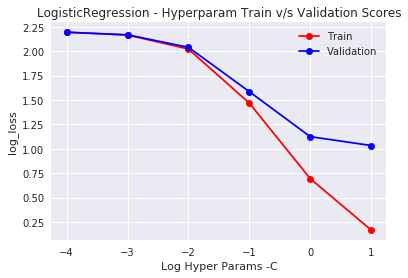

Best hyperparam value:  {'C': 10.0} Best Train Score:  0.16948266870028159 Best Validation Score:  1.0337089335464669
2019-06-28 14:38:23.310840  Hyperparam Tuning of LogisticRegression completed


In [29]:
param_dict_lr_bal = {'C':[1e-04, 1e-03, 1e-02, 1e-01, 1e-0, 1e+1]}
print(datetime.now() ,' Hyperparam Tuning of LogisticRegression started')
hyp_tuned_info_lr_bal = get_best_hyperparam_LogisticRegression(param_dict_lr_bal, X_train, y_train,
                                                              random_search=False, balanced=True)
print(datetime.now() ,' Hyperparam Tuning of LogisticRegression completed')

# separate out the fields
lr_bal_best_hyp, lr_bal_best_tr_score, lr_bal_best_val_score = hyp_tuned_info_lr_bal

In [30]:
lr_bal_clf = LogisticRegression(C=lr_bal_best_hyp['C'], class_weight='balanced')
calib_lr_bal_clf = CalibratedClassifierCV(base_estimator=lr_bal_clf, 
                                               method='sigmoid', cv=3)

### Step 2. Train the model with best hyperparam value

In [31]:
lr_bal_clf.fit(X_train, y_train)
calib_lr_bal_clf.fit(X_train, y_train)

# save model to disk
pickle_out = open("./model/logistic_regression_bal.pkl","wb")
pickle.dump(calib_lr_bal_clf, pickle_out)
pickle_out.close()

In [32]:
#load model from disk
pickle_in = open("./model/logistic_regression_bal.pkl","rb")
calib_lr_bal_clf = pickle.load(pickle_in)
pickle_in.close()

table_entry_lr_balanced_train = evaluate_model(calib_lr_bal_clf, X_train, y_train,
                                              title_suffix='Train',
                                              plot_fig=False)

Test Log loss value :  0.4406496916122294


### Step 3. Evaluate the model on test data

In [33]:
table_entry_lr_balanced_test = evaluate_model(calib_lr_bal_clf, X_test, y_test,
                                              title_suffix='Train',
                                              plot_fig=False)

Test Log loss value :  1.000934147123912


In [34]:
lr_bal_table_entry = ('LR- Balanced', lr_bal_best_hyp,) + table_entry_lr_balanced_train +\
                     table_entry_lr_balanced_test

### Step 4 : Feature Importance

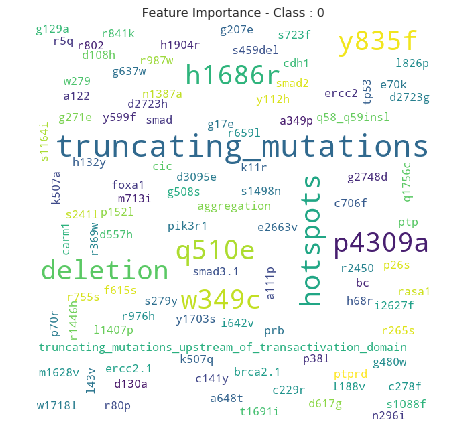

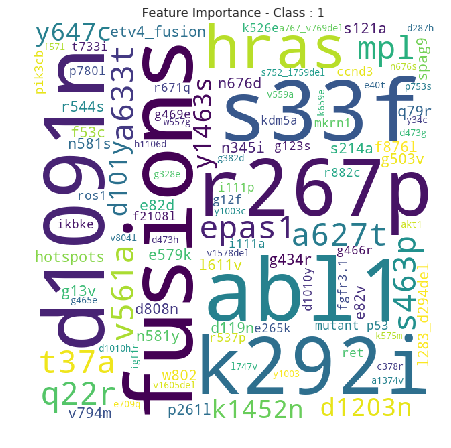

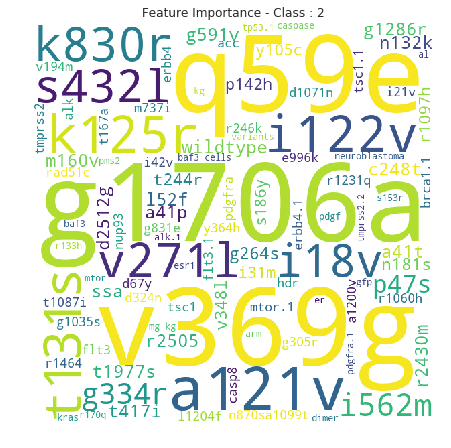

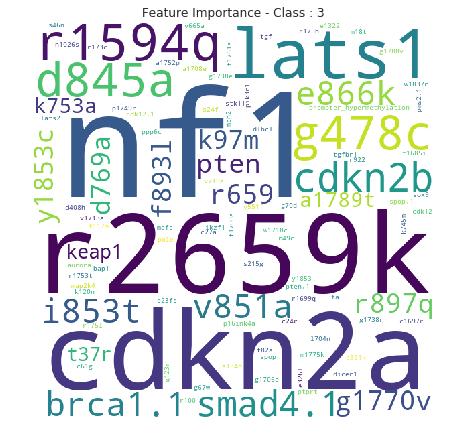

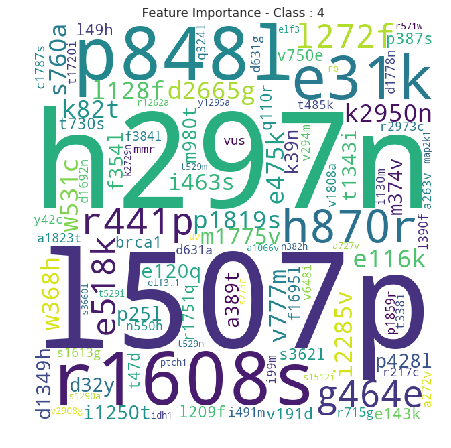

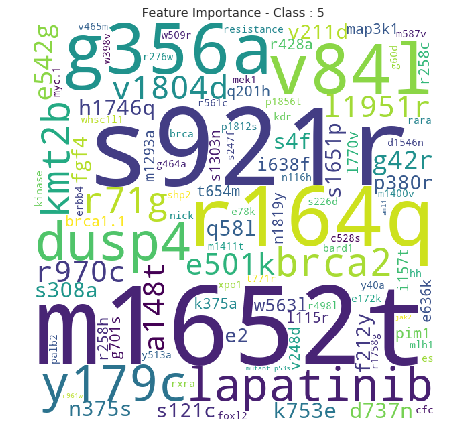

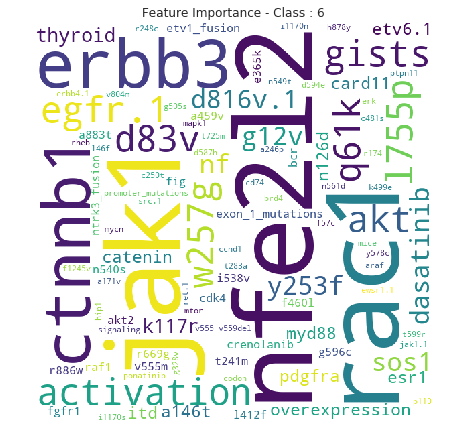

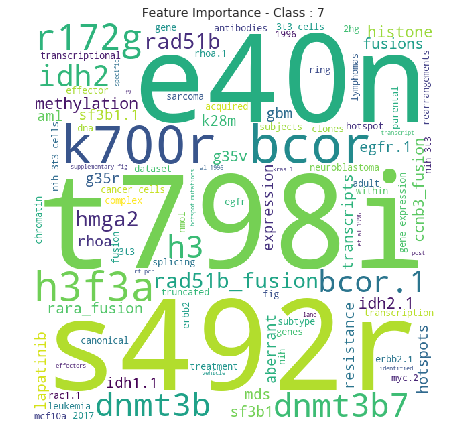

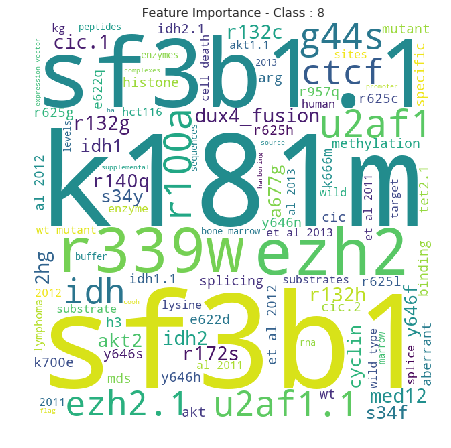

In [35]:
get_feature_importance(lr_bal_clf, 100, feat_names_list)

<h3>4.3.2. Without Class balancing</h3>

### Step 1. Find the best hyperparm values

2019-06-28 14:38:43.762959  Hyperparam Tuning of LogisticRegression (ubal) started


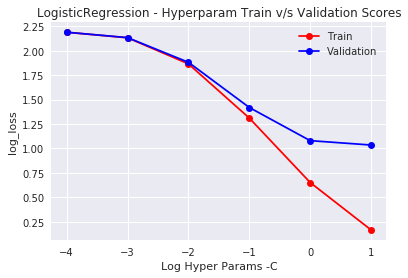

Best hyperparam value:  {'C': 10.0} Best Train Score:  0.16571394426415234 Best Validation Score:  1.0350323990338648
2019-06-28 14:38:54.758050  Hyperparam Tuning of LogisticRegression (ubal) completed


In [36]:
param_dict_lr_ubal = {'C':[1e-04, 1e-03, 1e-02, 1e-01, 1e-0, 1e+1]}
print(datetime.now() ,' Hyperparam Tuning of LogisticRegression (ubal) started')
hyp_tuned_info_ubal = get_best_hyperparam_LogisticRegression(param_dict_lr_ubal, X_train, y_train,
                                                            random_search=False, balanced=False)
print(datetime.now() ,' Hyperparam Tuning of LogisticRegression (ubal) completed')

# separate out the fields
lr_ubal_best_hyp, lr_ubal_best_tr_score, lr_ubal_best_val_score = hyp_tuned_info_ubal

In [37]:
lr_ubal_clf = LogisticRegression(C=lr_ubal_best_hyp['C'], class_weight=None)
calib_lr_ubal_clf = CalibratedClassifierCV(base_estimator=lr_ubal_clf, 
                                               method='sigmoid', cv=3)

### Step 2. Train the model with best hyperparam value

In [38]:
lr_ubal_clf.fit(X_train, y_train)
calib_lr_ubal_clf.fit(X_train, y_train)

# save model to disk
pickle_out = open("./model/logistic_regression_ubal.pkl","wb")
pickle.dump(calib_lr_ubal_clf, pickle_out)
pickle_out.close()

In [39]:
#load model from disk
pickle_in = open("./model/logistic_regression_ubal.pkl","rb")
calib_lr_ubal_clf = pickle.load(pickle_in)
pickle_in.close()

table_entrylr_ubal_train = evaluate_model(calib_lr_ubal_clf, X_train, y_train,
                                         title_suffix='Train',
                                         plot_fig=False)

Test Log loss value :  0.43507652411056863


### Step 3. Evaluate the model on test data

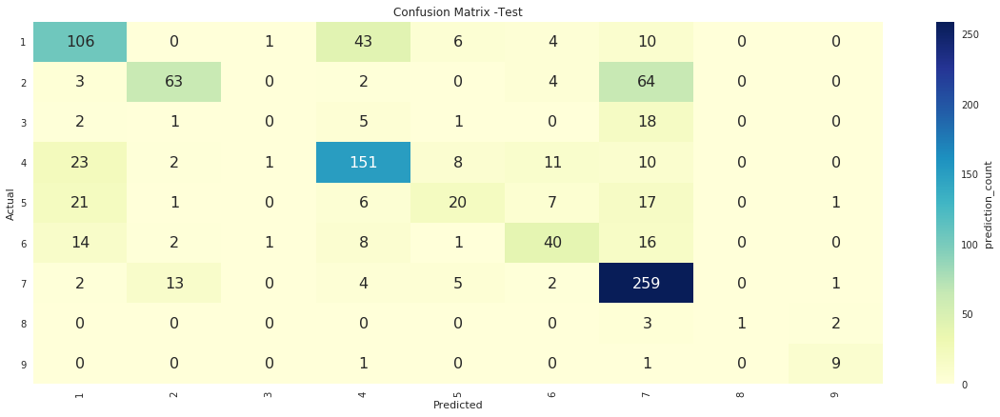

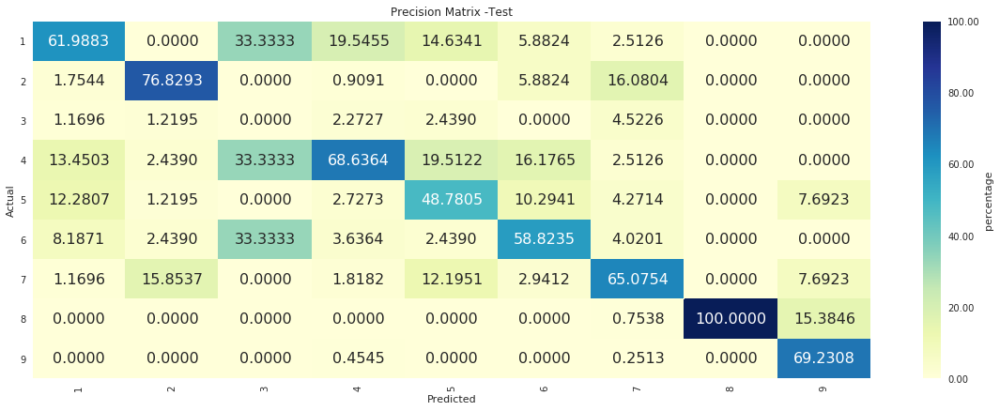

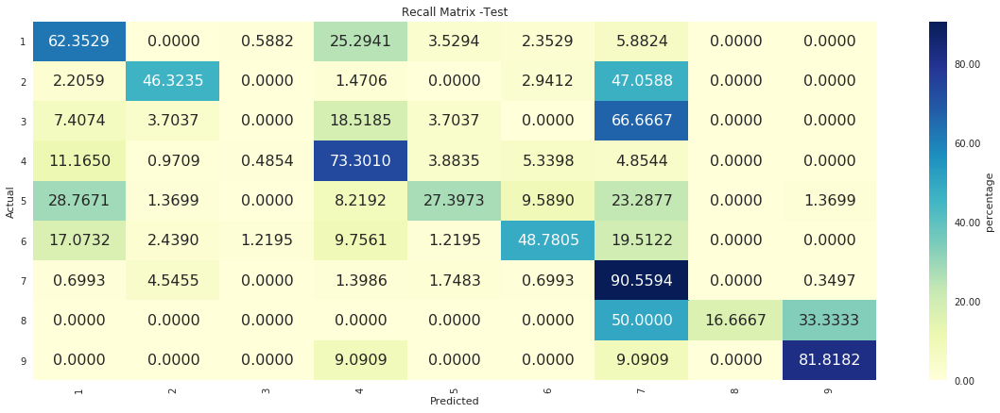

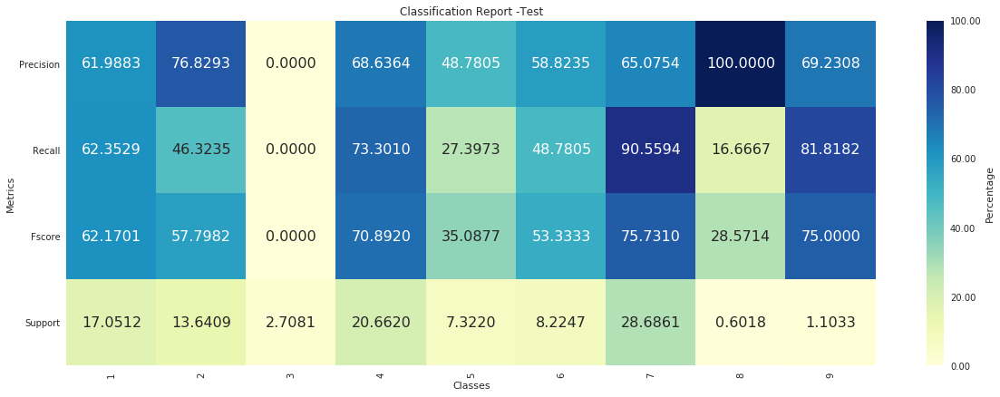

Test Log loss value :  1.0007914827097453


In [40]:
table_entrylr_ubal_test = evaluate_model(calib_lr_ubal_clf, X_test, y_test,
                                         title_suffix='Test',
                                         plot_fig=True)

In [41]:
lr_ubal_table_entry = ('LR- Imbalanced', lr_ubal_best_hyp,) + \
                      table_entrylr_ubal_train + table_entrylr_ubal_test

### Step 4. Feature Importance

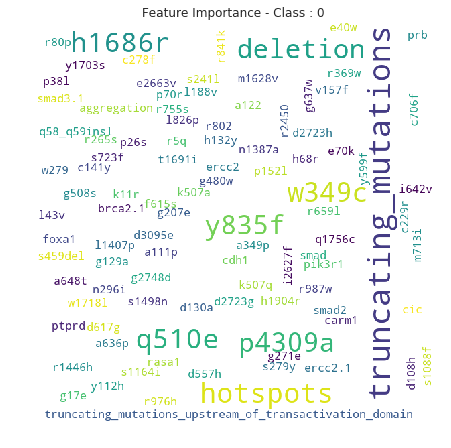

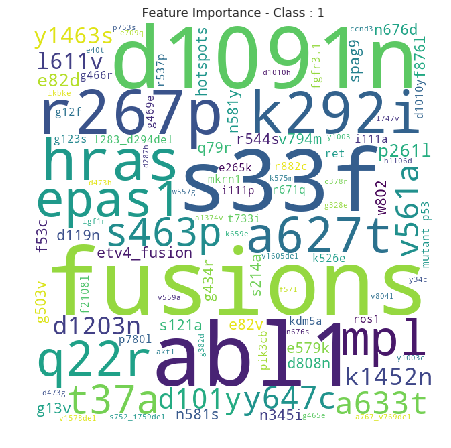

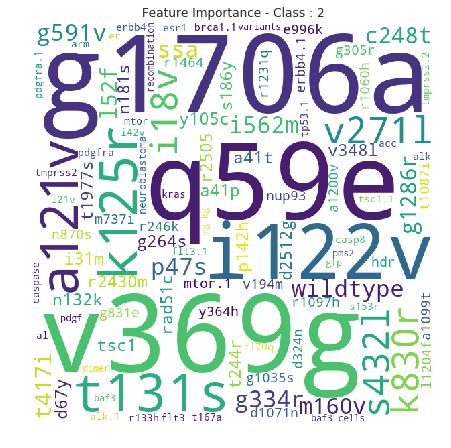

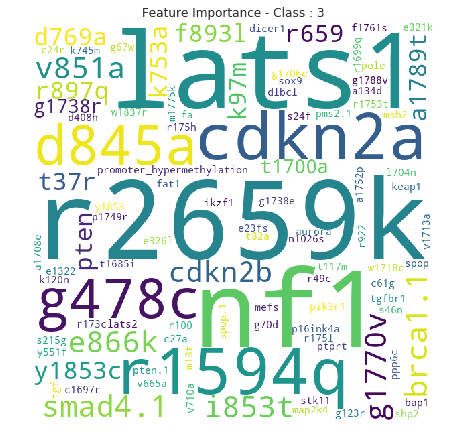

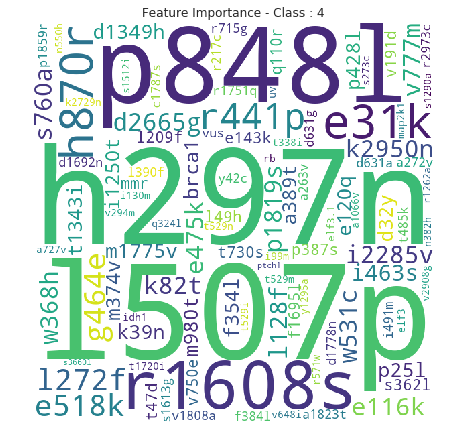

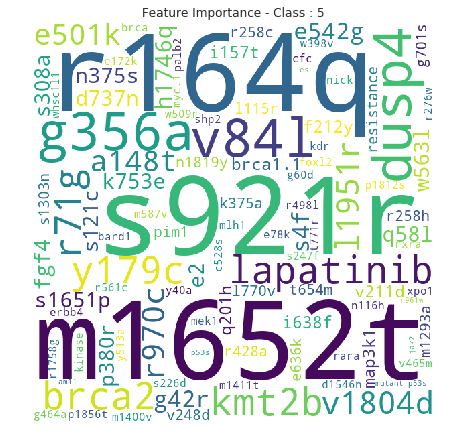

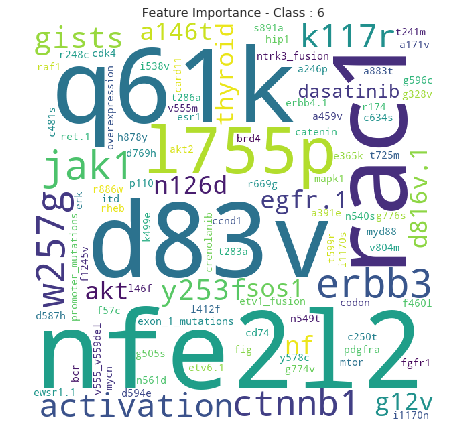

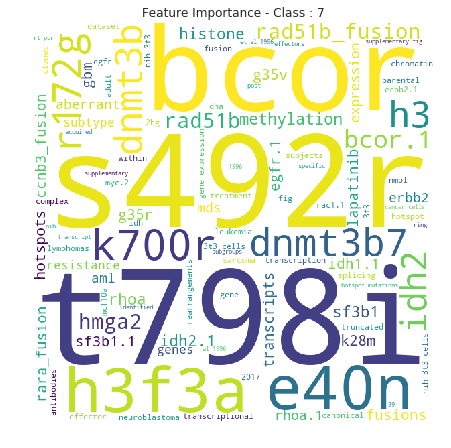

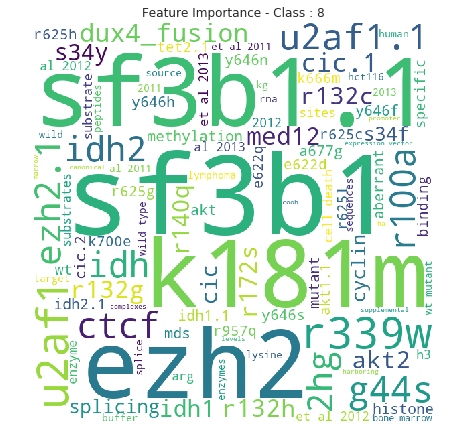

In [42]:
get_feature_importance(lr_ubal_clf, 100, feat_names_list)

<h3> Observations </h3>
<ul>
<li> As the alpha value increases train log loss tends to decrease for train, validataion data.
<li> From confusion matrix, precision, recall matrix, Model performed well in predicting class 7, 9
     with 75+  percenage f-score</li>
<li> Model showed poor performance on rare class 3 (0.0% precision & recall) </li>
<li> Feture importances are shown in the wordcloud representation </li>
</ul>

<h2>4.4. Linear Support Vector Machines</h2>

In [43]:
def get_best_hyperparam_SVM_Classifier(param_list, X, y):
    
    print(datetime.now() ,' Hyperparam tuning of SVM started')
    
    # set the scoring function
    final_scorer = 'log_loss'
    

    # set data partitioning method
    cv_data = 3
    
    # set stratified K fold validation
    skf = StratifiedKFold(n_splits=cv_data)
    
    #declare two list for holding the loss for train, validation
    tr_loss_all = list()
    val_loss_all = list()
    
    for alpha_val in param_list:
        
        # declare model
        model = SGDClassifier(loss='hinge', alpha=alpha_val, tol=1e-03, 
                              max_iter=1e+03, penalty='l2', n_jobs=-1)
        
        # decalre calibrated classifier
        calib_model = CalibratedClassifierCV(base_estimator=model, 
                                             method='sigmoid',
                                             cv='prefit')
        
        # declare two lists for train, validation loss for each fold
        train_loss_list = list()
        val_loss_list = list()
        
        # evaluate for each fold
        for train_index, val_index in skf.split(X, y):
            
            # get train test split for this fold
            X_train, X_val = X.loc[train_index,:], X.loc[val_index,:]
            y_train, y_val = y[train_index], y[val_index]
            
            # fit to data
            model.fit(X_train, y_train)
            calib_model.fit(X_val, y_val)
        
            # get train, test log loss
            tr_probs = calib_model.predict_proba(X_train)
            val_probs = calib_model.predict_proba(X_val)
            
            # insert into log loss list
            train_loss_list.append(log_loss(y_train, tr_probs,
                                            labels=list(range(0,9)), 
                                            eps=1e-15))
            val_loss_list.append(log_loss(y_val, val_probs, 
                                          labels=list(range(0,9)), 
                                          eps=1e-15))
    
        # compute mean loss values
        mean_tr_loss = np.mean(train_loss_list)
        mean_val_loss = np.mean(val_loss_list)
        
        # update the lists
        tr_loss_all.append(mean_tr_loss)
        val_loss_all.append(mean_val_loss)
    
    # get total number of param settings
    # get number of rows in the search cv data frame
    num_rows = len(param_list)
        
    # create the grid search info df 
    cv_results_dict = {'alpha': param_list,
                       'mean_train_log_loss': tr_loss_all,
                       'mean_test_log_loss': val_loss_all}
    
    grid_info_df = pd.DataFrame(cv_results_dict, index=range(num_rows))
    
    # prepare a list of reqired columns
    required_columns = ['alpha', 'mean_train_log_loss', 
                        'mean_test_log_loss']
    
    # slice the data frame to only required columns
    grid_info_df = grid_info_df[required_columns]
    
        
    # Find the best hyperparam & its corresponding scores
    best_hyperparam_record = grid_info_df.loc[grid_info_df[
                                   'mean_test_'+ final_scorer].idxmin(),:] 
        
    # best hyperparam & corresponding scores
    best_hyperparam = {'alpha':best_hyperparam_record['alpha']}
    best_train_score = best_hyperparam_record['mean_train_'+ final_scorer]
    best_validation_score = best_hyperparam_record['mean_test_'+ final_scorer]
    
    # plot the hyper params 
    # extract individual fiedls
    x_vals = np.log10(param_list)
    y_vals_tr = grid_info_df['mean_train_' + final_scorer].tolist()
    y_vals_val = grid_info_df['mean_test_' + final_scorer].tolist()

    # plot train, validation performances
    plt.plot(x_vals, y_vals_tr, label='Train', color='r', marker='o', linestyle='-')
    plt.plot(x_vals, y_vals_val, label='Validation', color='b', marker='o', linestyle='-')
    plt.xlabel('Log Hyper Params - Alpha')
    plt.ylabel(final_scorer)
    plt.legend()
    plt.title('SVM Classifier - Hyperparam Train v/s Validation Scores')
    plt.show()
        
    print('Best hyperparam value: ', best_hyperparam, 'Best Train Score: ', best_train_score, 
          'Best Validation Score: ', best_validation_score)
   
          
    # return tuple
    ret_tuple = (best_hyperparam, best_train_score, best_validation_score,)
    
    print(datetime.now() ,' Hyperparam tuning of SVM completed')
    
    
    return ret_tuple

### Step 1. Find the best hyperparm values

2019-06-28 14:39:16.810551  Hyperparam Tuning of  Linear SVM started
2019-06-28 14:39:16.810848  Hyperparam tuning of SVM started


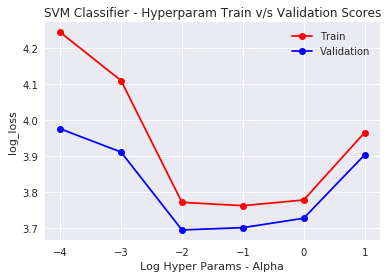

Best hyperparam value:  {'alpha': 0.01} Best Train Score:  3.7721385444726114 Best Validation Score:  3.6954595189030317
2019-06-28 14:39:30.376680  Hyperparam tuning of SVM completed
2019-06-28 14:39:30.385070  Hyperparam Tuning of Linear SVM (ubal) completed


In [44]:
#param_dict_svm = {'C':[1e-04, 1e-03, 1e-02, 1e-01, 1e-0, 1e+1]}
param_list_svm = [1e-04, 1e-03, 1e-02, 1e-01, 1e-0, 1e+1]
print(datetime.now() ,' Hyperparam Tuning of  Linear SVM started')
hyp_tuned_info_svm = get_best_hyperparam_SVM_Classifier(param_list_svm, X_train, y_train)
print(datetime.now() ,' Hyperparam Tuning of Linear SVM (ubal) completed')
# separate out the fields
svm_best_hyp, svm_best_tr_score, svm_best_val_score = hyp_tuned_info_svm

In [45]:
# declare model
svc_clf = SGDClassifier(loss='hinge', alpha=svm_best_hyp['alpha'], tol=1e-03, 
                        max_iter=1e+03, penalty='l2', n_jobs=-1)
        
# decalre calibrated classifier
calib_svc_clf = CalibratedClassifierCV(base_estimator=svc_clf, 
                                       method='sigmoid',
                                       cv=3)

### Step 2. Train the model with best hyperparam value

In [46]:
svc_clf.fit(X_train, y_train)
calib_svc_clf.fit(X_train, y_train)

# save model to disk
pickle_out = open("./model/linear_svm.pkl","wb")
pickle.dump(calib_svc_clf, pickle_out)
pickle_out.close()

In [47]:
#load model from disk
pickle_in = open("./model/linear_svm.pkl","rb")
calib_svc_clf = pickle.load(pickle_in)
pickle_in.close()

table_entry_svc_train = evaluate_model(calib_svc_clf, X_train, y_train,
                                     title_suffix='Train',
                                     plot_fig=False)

Test Log loss value :  0.9635228918896823


### Step 3. Evaluate the model on test data

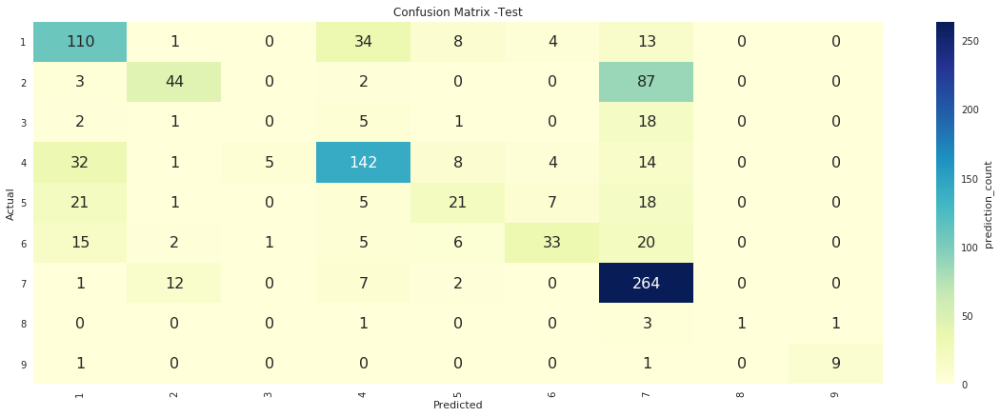

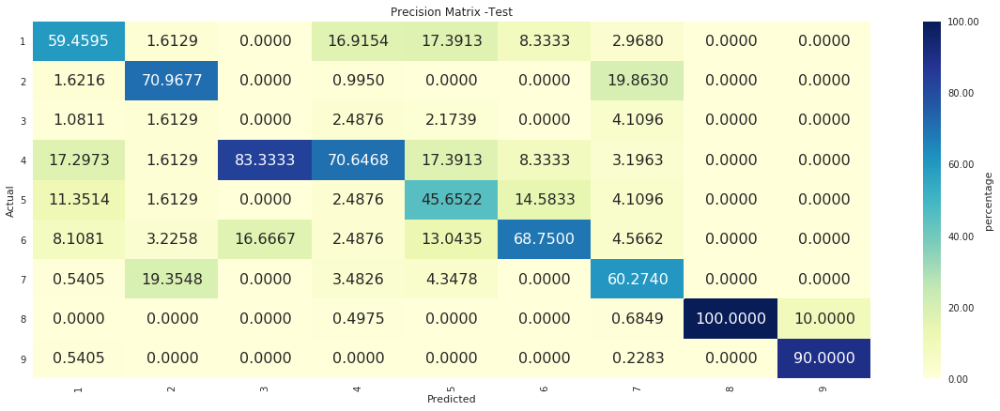

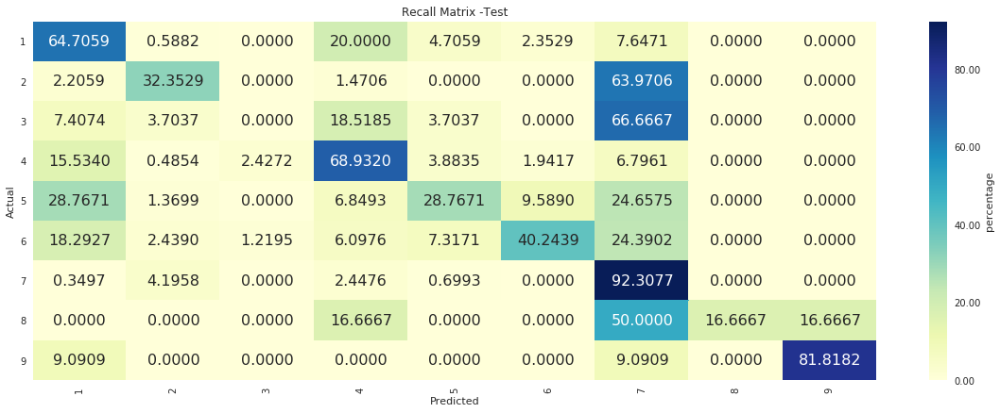

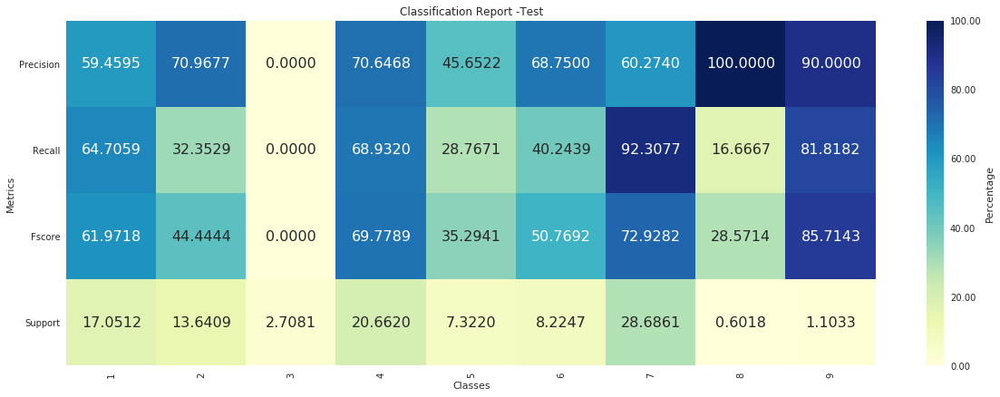

Test Log loss value :  1.2605374731596724


In [48]:
table_entry_svc_test = evaluate_model(calib_svc_clf, X_test, y_test,
                                     title_suffix='Test',
                                     plot_fig=True)

In [49]:
svc_table_entry = ('Linear-SVC', svm_best_hyp,) + table_entry_svc_train + table_entry_svc_test 

### Step 4. Feature Importance

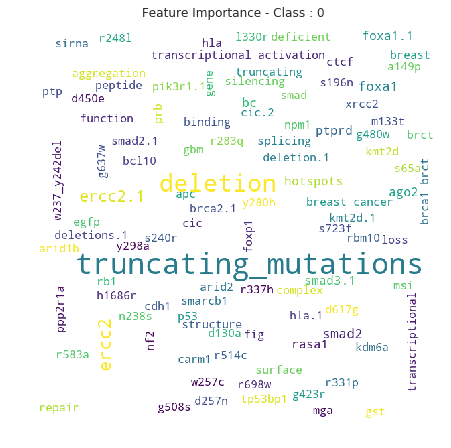

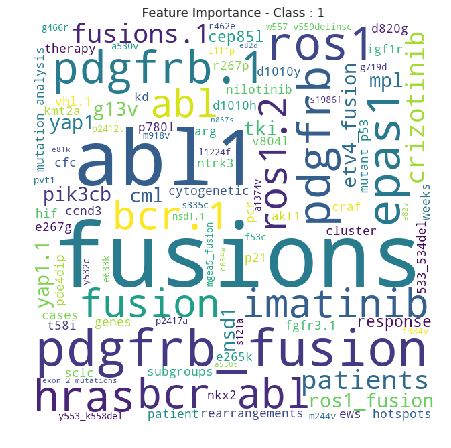

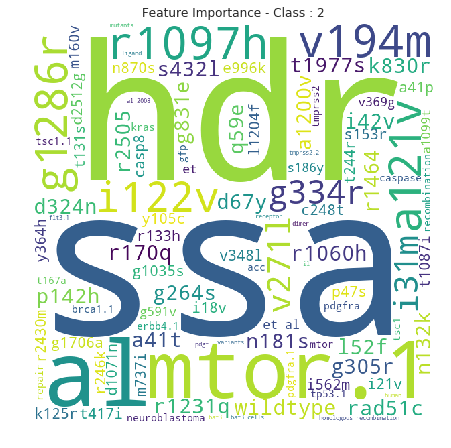

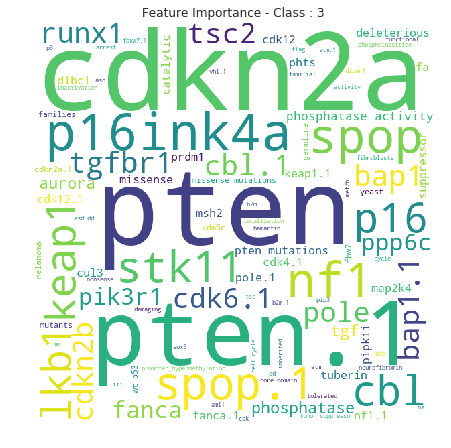

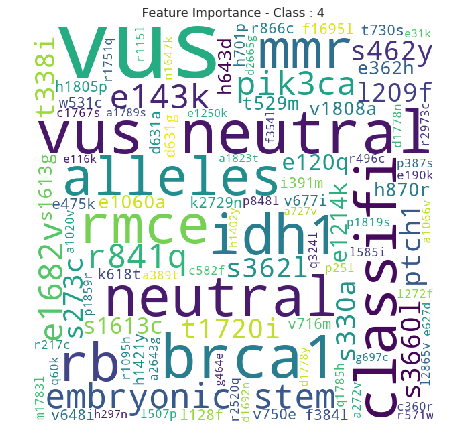

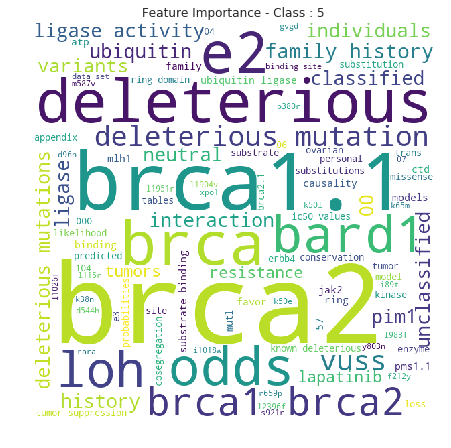

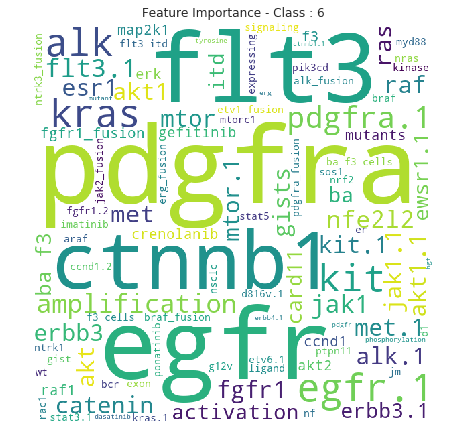

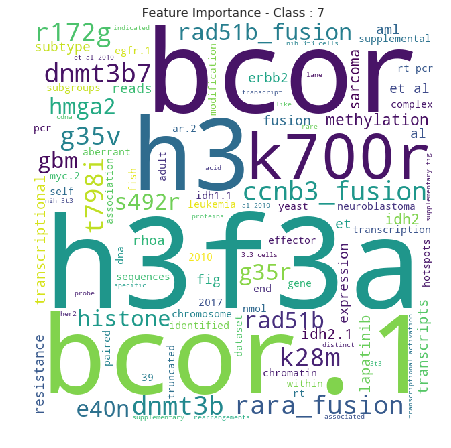

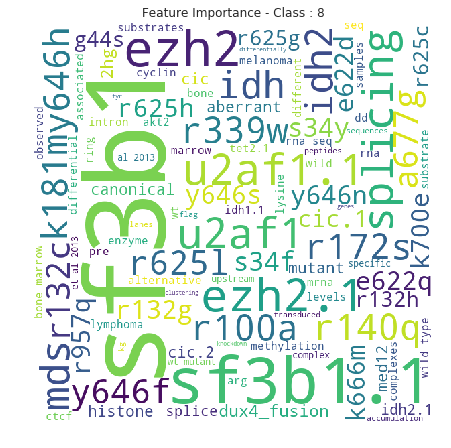

In [50]:
get_feature_importance(svc_clf, 100, feat_names_list)

<h3> Observations </h3>
<ul>
<li> From confusion matrix, precision, recall matrix, Model performed well in predicting class 7, 9
     with 72+, 85+  percenage f-score respectively</li>
<li> Model showed poor performance on rare class 3 (0.0% precision & recall) </li>
<li> Feture importances are shown in the wordcloud representation </li>
</ul>

<h2>4.5 Random Forest Classifier</h2>

In [51]:
def get_best_hyperparam_RFClassifier(param_dict, X, y, random_search=False):
    
    # set the scoring function
    final_scorer = 'log_loss'

    # declare a scoring dictionary
    score_dict = {
        'log_loss': make_scorer(score_func=log_loss, greater_is_better=False,
                                needs_proba=True, needs_threshold=False,
                                labels=class_labels_list)
    }


    #Declare the metric as  'minimization' or 'maximization'
    optimization_dict = {
        'log_loss' : 'minimization'
       }

    
    # Time Series split
    # cv_data = TimeSeriesSplit(n_splits=3)
    cv_data = 3
        
     
    # declare model
    model = RandomForestClassifier()
    
    if random_search:
        search_cv = RandomizedSearchCV(estimator=model, param_distributions=param_dict, 
                                       cv=cv_data, scoring=score_dict, refit=False, 
                                       return_train_score=True, n_iter=6, n_jobs=-1)
        
    else:
        # declare grid search CV object
        search_cv = GridSearchCV(estimator=model, param_grid=param_dict, cv=cv_data,
                                 scoring=score_dict, refit=False, 
                                 return_train_score=True, n_jobs=-1)
    
    # fit to the data
    search_cv.fit(X, y)
    
    
    # get total number of param settings
    param_list = list(param_dict.keys())
    param_field_list = ['param_' + item for item in param_list]
    
    # get list of train metric list
    train_metric_list = ['mean_train_' + item for item in score_dict.keys()]
    # get list of test metric list
    test_metric_list = ['mean_test_' + item for item in score_dict.keys()]
    
    # get number of rows in the search cv data frame
    num_rows = len(search_cv.cv_results_['params'])
        
    # create the grid search info df  
    grid_info_df = pd.DataFrame(search_cv.cv_results_, index=range(num_rows))
    
    # prepare a list of reqired columns
    required_columns = ['params'] + param_field_list + train_metric_list + \
                       test_metric_list
    
    # slice the data frame to only required columns
    grid_info_df = grid_info_df[required_columns]
    
    # process individual metrics
    for metric, optimization in optimization_dict.items():
        if optimization == 'minimization':
            grid_info_df['mean_train_' + metric] *= -1
            grid_info_df['mean_test_' + metric] *= -1
            
    # Find the best hyperparam & its corresponding scores
    if optimization_dict[final_scorer] == 'minimization':
        best_hyperparam_record = grid_info_df.loc[grid_info_df[
                                   'mean_test_'+ final_scorer].idxmin(),:] 
    else:
        best_hyperparam_record = grid_info_df.loc[grid_info_df[
                                   'mean_test_'+ final_scorer].idxmax(),:]
        
    # best hyperparam & corresponding scores
    best_hyperparam = best_hyperparam_record['params']
    best_train_score = best_hyperparam_record['mean_train_'+ final_scorer]
    best_validation_score = best_hyperparam_record['mean_test_'+ final_scorer]
    
    # plot the hyper params 
    if len(param_list) == 1:
        
        # extract individual fiedls
        x_vals = grid_info_df[param_field_list[0]].tolist()
        y_vals_tr = grid_info_df['mean_train_' + final_scorer].tolist()
        y_vals_val = grid_info_df['mean_test_' + final_scorer].tolist()
        
        # plot train, validation performances
        plt.plot(x_vals, y_vals_tr, label='Train', color='r', marker='o', linestyle='-')
        plt.plot(x_vals, y_vals_val, label='Validation', color='b', marker='o', linestyle='-')
        plt.xlabel('Hyper Params -' + param_list[0])
        plt.ylabel(final_scorer)
        plt.legend()
        plt.title('RF Classifier - Hyperparam Train v/s Validation Scores')
        plt.show()
        
        
    # Heatmap plot for pair of hyperparam values  
    elif len(param_list) == 2:
        # get pivoted table
        train_hyp_df = pd.pivot_table(data=grid_info_df, index=param_field_list[0], 
                                      columns=param_field_list[1],
                                      values='mean_train_' + final_scorer , 
                                      fill_value=np.inf)
        sns.heatmap(train_hyp_df, annot=True, cmap='YlGnBu', fmt='.4f',
                   cbar_kws={'label': final_scorer, 'format':'%.2f'})
        plt.xlabel(param_list[1])
        plt.ylabel(param_list[0])
        plt.title('RF Classifier - Hyperparams Scores - Train')
        plt.show()
        
        print('\n'*3)
        
        # Test hyperparam
        
        # get pivoted table
        train_hyp_df = pd.pivot_table(data=grid_info_df, index=param_field_list[0], 
                                      columns=param_field_list[1],
                                      values='mean_test_' + final_scorer, fill_value=np.inf)
        sns.heatmap(train_hyp_df, annot=True, cmap='YlGnBu', fmt='.4f',
                   cbar_kws={'label': final_scorer, 'format':'%.2f'})
        plt.xlabel(param_list[1])
        plt.ylabel(param_list[0])
        plt.title('RF Classifier - Hyperparams Scores - Validation')
        plt.show()
        
    else:
        print(grid_info_df)
    
    print('Best hyperparam value: ', best_hyperparam, 'Best Train Score: ', best_train_score, 
          'Best Validation Score: ', best_validation_score)
   
          
    #best_mse_train = best_hyperparam_record['mean_train_MSE']
    #best_mse_validation = best_hyperparam_record['mean_test_MSE']
    
    # return tuple
    ret_tuple = (best_hyperparam, best_train_score, best_validation_score,)
    
    
    return ret_tuple

<h3>4.5.2. Testing model with best hyper parameters (One Hot Encoding)</h3>

### Step 1. Find the best hyperparm values

2019-06-28 14:39:42.960227  Hyperparam Tuning of  RandomForest started


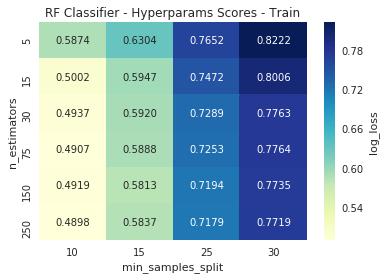

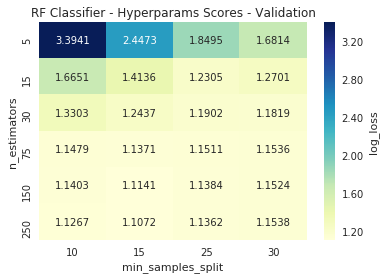

Best hyperparam value:  {'min_samples_split': 15, 'n_estimators': 250} Best Train Score:  0.5836730186159254 Best Validation Score:  1.1071709108271366
2019-06-28 14:40:35.999336  Hyperparam Tuning of  RandomForest completed


In [52]:
param_dict_rf = {'n_estimators':[5, 15, 30, 75, 150, 250], 
                 'min_samples_split':[10, 15, 25, 30]}
print(datetime.now() ,' Hyperparam Tuning of  RandomForest started')
hyp_tuned_info_rf = get_best_hyperparam_RFClassifier(param_dict_rf, X_train, y_train)
print(datetime.now() ,' Hyperparam Tuning of  RandomForest completed')

# separate out the fields
rf_best_hyp, rf_best_tr_score, rf_best_val_score = hyp_tuned_info_rf

In [53]:
rf_clf = RandomForestClassifier(n_estimators=rf_best_hyp['n_estimators'], 
                                min_samples_split=rf_best_hyp['min_samples_split'])
calib_rf_clf = CalibratedClassifierCV(base_estimator=rf_clf, 
                                      method='sigmoid', cv=3)

### Step 2. Train the model with best hyperparam value

In [54]:
rf_clf.fit(X_train, y_train)
calib_rf_clf.fit(X_train, y_train)

# save model to disk
pickle_out = open("./model/rf_onehot_clf.pkl","wb")
pickle.dump(calib_rf_clf, pickle_out)
pickle_out.close()

In [55]:
#load model from disk
pickle_in = open("./model/rf_onehot_clf.pkl","rb")
calib_rf_clf = pickle.load(pickle_in)
pickle_in.close()

table_entry_rf_train = evaluate_model(calib_rf_clf, X_train, y_train,
                                    title_suffix='Train',
                                    plot_fig=False)

Test Log loss value :  0.5875557079932703


### Step 3. Evaluate the model on test data

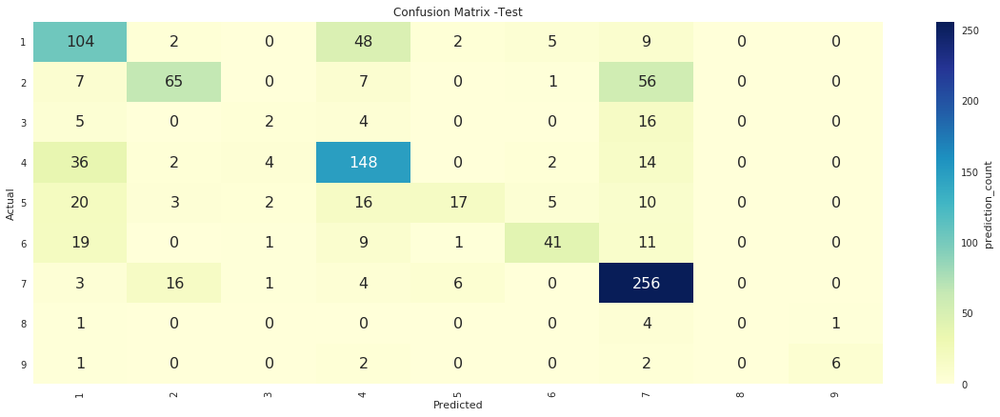

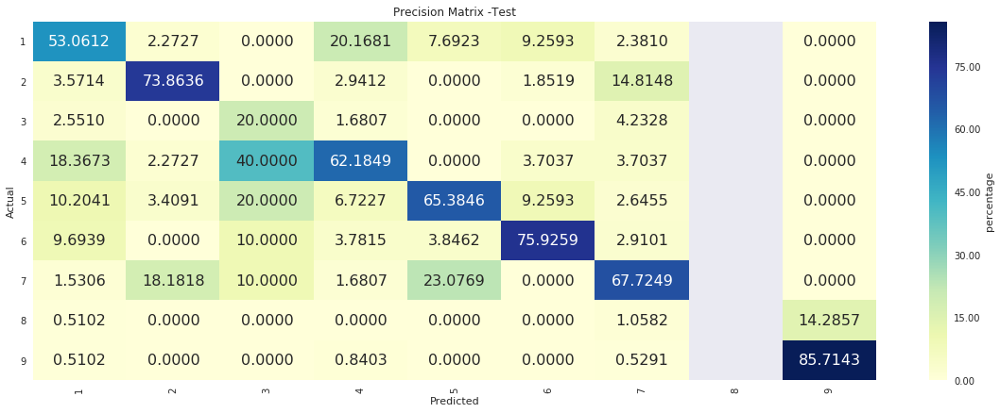

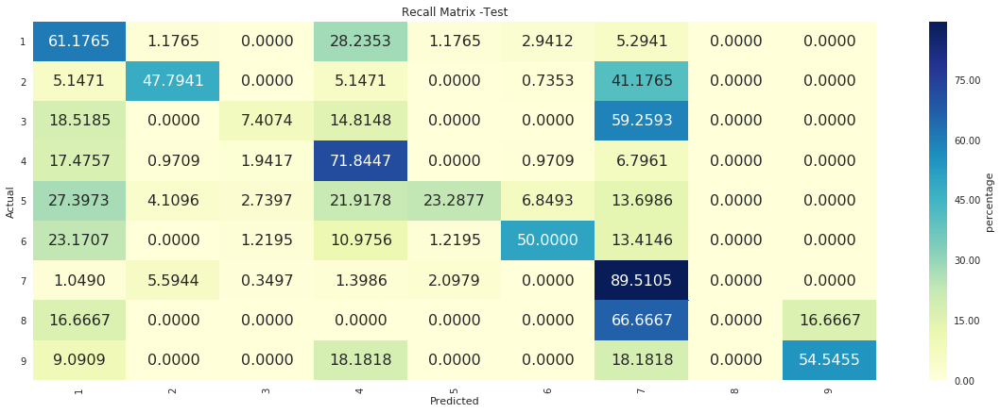

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


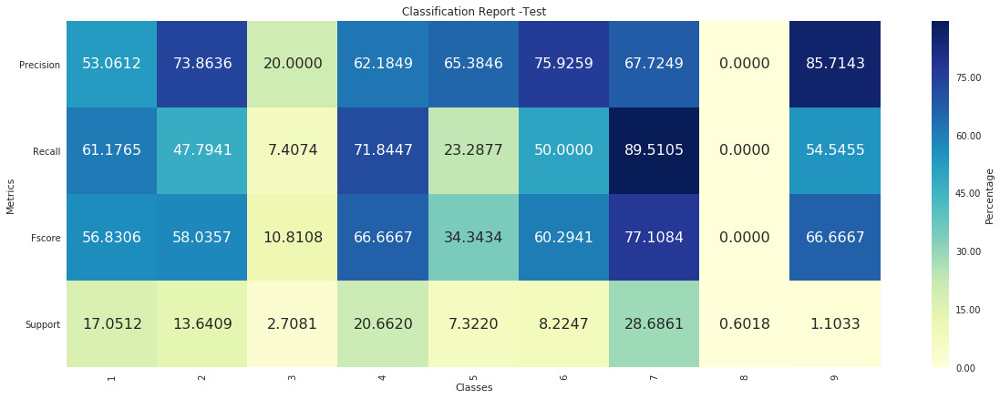

Test Log loss value :  1.0892636442714267


In [56]:
table_entry_rf_test = evaluate_model(calib_rf_clf, X_test, y_test,
                                    title_suffix='Test',
                                    plot_fig=True)

<h3>4.5.3. Feature Importance</h3>

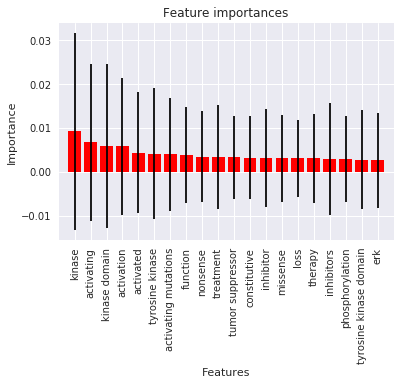

In [57]:
plot_rf_feat_importance(rf_clf, feat_names_list)

In [58]:
rf_table_entry =  ('RF-Onehot', rf_best_hyp,) + table_entry_rf_train + table_entry_rf_test

<h3>4.5.3. Hyper paramter tuning (With Response Coding)</h3>

In [59]:
df_train_res = pd.read_csv(res_train_path, index_col=False)
df_test_res = pd.read_csv(res_test_path, index_col=False)
df_train_res.head()

,Gene_cls_1,Gene_cls_2,Gene_cls_3,Gene_cls_4,Gene_cls_5,Gene_cls_6,Gene_cls_7,Gene_cls_8,Gene_cls_9,Variation_cls_1,...,txt_cls_2,txt_cls_3,txt_cls_4,txt_cls_5,txt_cls_6,txt_cls_7,txt_cls_8,txt_cls_9,Label,ID
0,0.252136,0.680768,0.252136,0.252136,0.252136,0.252136,0.302564,0.252136,0.252136,0.329511,...,0.322107,0.052857,0.383367,0.117426,0.137037,0.784390,0.026984,0.042601,7,837
1,0.701850,0.136180,0.125704,0.638997,0.115229,0.136180,0.104754,0.104754,0.104754,0.362462,...,0.285996,0.054467,0.519657,0.132252,0.164782,0.591402,0.027305,0.049102,1,493
2,0.301786,0.331964,0.301786,0.301786,0.301786,0.301786,0.482857,0.301786,0.331964,0.178571,...,0.302474,0.065920,0.365679,0.129038,0.134495,0.784854,0.037657,0.069250,7,1376
3,0.244631,0.464799,0.244631,0.293557,0.366947,0.244631,0.513725,0.244631,0.244631,0.329511,...,0.350547,0.060826,0.381435,0.139218,0.121461,0.776456,0.027782,0.046263,2,3283
4,0.158710,0.507873,0.158710,0.174581,0.253936,0.190452,0.714196,0.158710,0.158710,0.329511,...,0.356645,0.052052,0.343076,0.121950,0.130782,0.787546,0.029820,0.045347,7,2708


In [60]:
if (sample_size > 0):
    df_train_res = df_train_res.groupby(['Label']).apply(lambda x : 
                    x.sample(n=min(x.shape[0], sample_size )))
    df_train_res = df_train_res.reset_index(drop=True)
    df_test_res = df_test_res.groupby(['Label']).apply(lambda x : 
                    x.sample(n=min(x.shape[0], sample_size )))
    df_test_res = df_test_res.reset_index(drop=True)

# split the data to features & labels
X_train_res  = df_train_res.drop(['ID', 'Label'], axis=1)
y_train_res = df_train_res['Label']

# Evaluate the model on Test data
X_test_res = df_test_res.drop(['ID', 'Label'], axis=1)
y_test_res = df_test_res['Label']

print('Shape of train df', df_train_res.shape)
print('Shape of test df', df_test_res.shape)

feat_names_list_res = X_train_res.columns.values.tolist()

Shape of train df (2324, 29)
Shape of test df (997, 29)


### Step 1. Find the best hyperparm values

2019-06-28 14:41:01.964610  Hyperparam Tuning of  RandomForest (response encoded) started


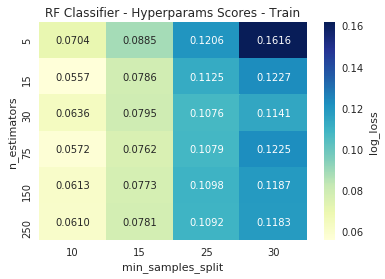

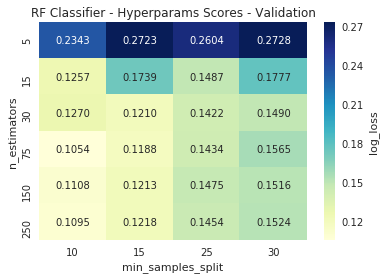

Best hyperparam value:  {'min_samples_split': 10, 'n_estimators': 75} Best Train Score:  0.05716167654040766 Best Validation Score:  0.1054371736021652
2019-06-28 14:41:09.937488  Hyperparam Tuning of  RandomForest (response encoded) completed


In [61]:
param_dict_rf_res = {'n_estimators':[5, 15, 30, 75, 150, 250], 
                     'min_samples_split':[10, 15, 25, 30]}
print(datetime.now() ,' Hyperparam Tuning of  RandomForest (response encoded) started')
hyp_tuned_info_rf_res= get_best_hyperparam_RFClassifier(param_dict_rf_res, X_train_res, 
                                                        y_train_res)
print(datetime.now() ,' Hyperparam Tuning of  RandomForest (response encoded) completed')

# separate out the fields
rf_res_best_hyp, rf_res_best_tr_score, rf_res_best_val_score = hyp_tuned_info_rf_res

In [62]:
rf_res_clf = RandomForestClassifier(n_estimators=rf_res_best_hyp['n_estimators'], 
                                    min_samples_split=rf_res_best_hyp['min_samples_split'])
calib_rf_res_clf = CalibratedClassifierCV(base_estimator=rf_res_clf, 
                                          method='sigmoid', cv=3)

### Step 2. Train the model with best hyperparam value

In [63]:
rf_res_clf.fit(X_train_res, y_train_res)
calib_rf_res_clf.fit(X_train_res, y_train_res)

# save model to disk
pickle_out = open("./model/rf_response_clf.pkl", "wb")
pickle.dump(calib_rf_res_clf, pickle_out)
pickle_out.close()

In [64]:
#load model from disk
pickle_in = open("./model/rf_response_clf.pkl","rb")
calib_rf_res_clf = pickle.load(pickle_in)
pickle_in.close()

table_entry_rf_res_train = evaluate_model(calib_rf_res_clf, X_train_res, 
                                          y_train_res,
                                          title_suffix='Train',
                                          plot_fig=False)

Test Log loss value :  0.0416856035694962


### Step 3. Evaluate the model on test data

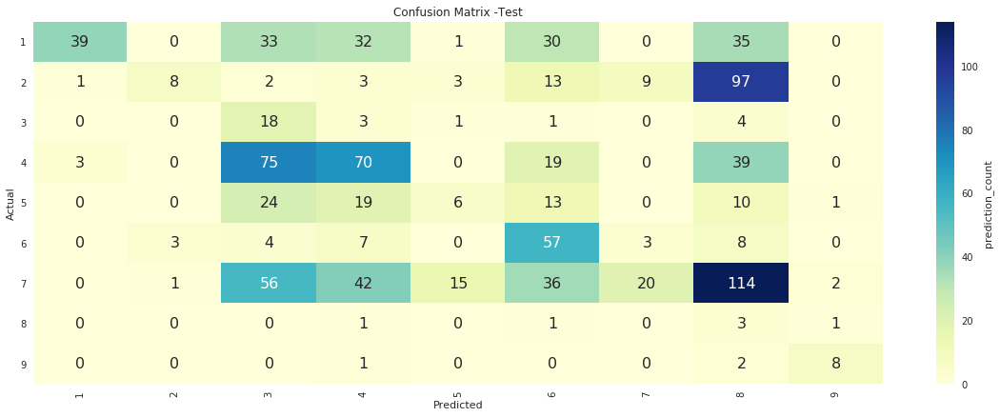

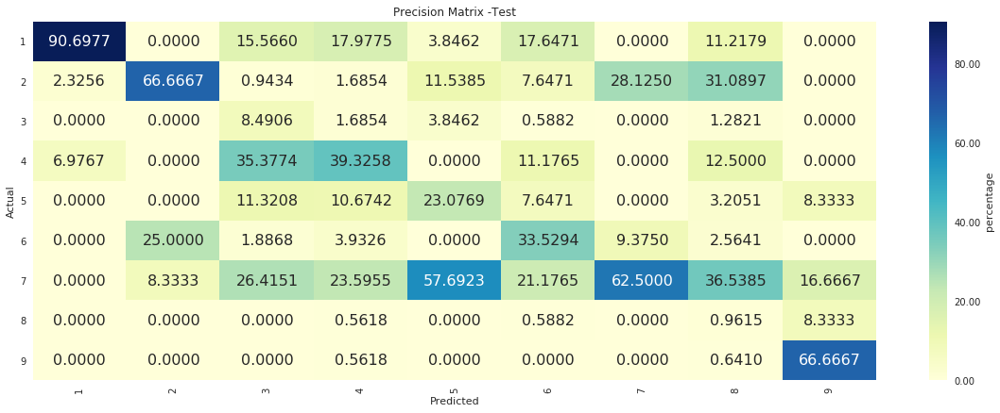

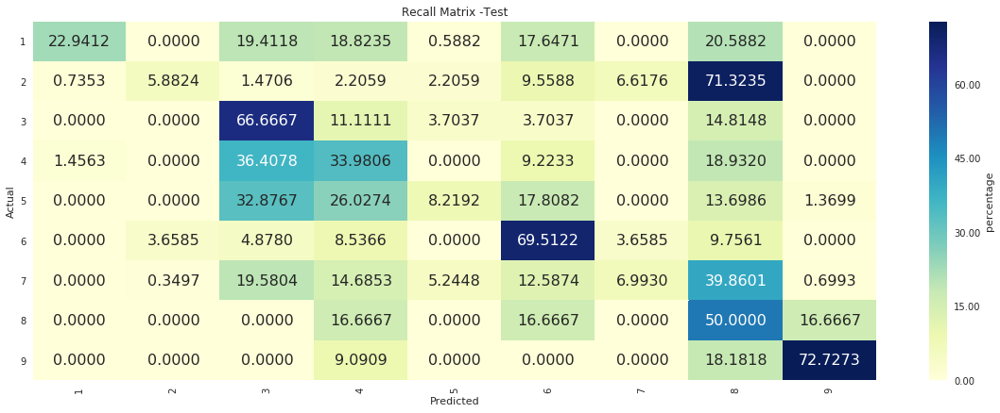

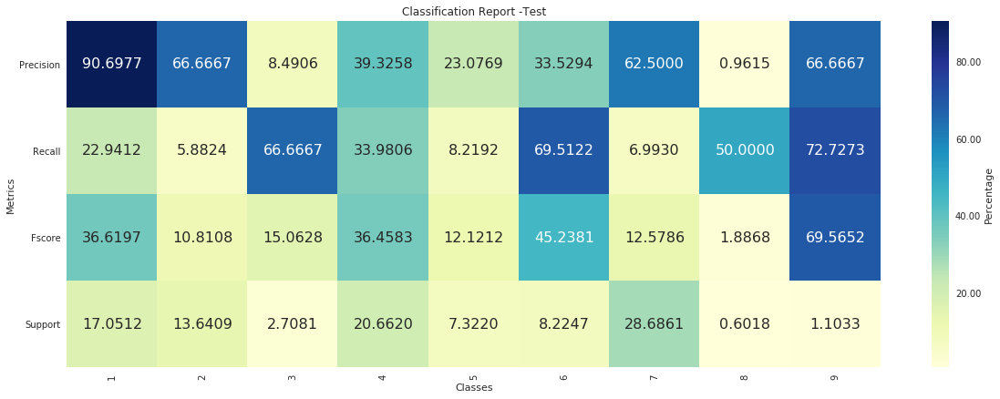

Test Log loss value :  1.9686244399294184


In [65]:
table_entry_rf_res_test = evaluate_model(calib_rf_res_clf, X_test_res, y_test_res,
                                        title_suffix='Test',
                                        plot_fig=True)

<h3>4.5.5. Feature Importance</h3>

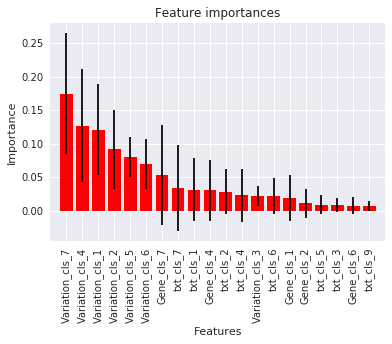

In [66]:
plot_rf_feat_importance(rf_res_clf, feat_names_list_res)

In [67]:
rf_res_table_entry =  ('RF-response', rf_res_best_hyp,) +table_entry_rf_res_train + table_entry_rf_res_test

<h3>  Observation </h3>
<ul>
<li> Random forest with TF-IDF encoding showed 0% f-score on rare class 8</li>
<li> Log loss </li>
</ul>

<h2>4.7 Stack the models </h2>

In [68]:
def get_best_hyperparam_StackedModel(param_dict, base_models_list, X, y, random_search=False):
    
    # set the scoring function
    final_scorer = 'log_loss'

    # declare a scoring dictionary
    score_dict = {
        'log_loss': make_scorer(score_func=log_loss, greater_is_better=False,
                                needs_proba=True, needs_threshold=False,
                                labels=class_labels_list)
    }


    #Declare the metric as  'minimization' or 'maximization'
    optimization_dict = {
        'log_loss' : 'minimization'
       }
    
    # Time Series split
    # cv_data = TimeSeriesSplit(n_splits=3)
    cv_data = 3
        
     
    # declare model
    meta_clf = LogisticRegression()
    model = StackingClassifier(classifiers=base_models_list, 
                               meta_classifier=meta_clf, use_probas=True)
    
    if random_search:
        search_cv = RandomizedSearchCV(estimator=model, param_distributions=param_dict, 
                                       cv=cv_data, scoring=score_dict, refit=False, 
                                       return_train_score=True, n_iter=6, n_jobs=-1)
        
    else:
        # declare grid search CV object
        search_cv = GridSearchCV(estimator=model, param_grid=param_dict, cv=cv_data,
                                 scoring=score_dict, refit=False, 
                                 return_train_score=True, n_jobs=-1)
    
    # fit to the data
    search_cv.fit(X, y)
    
    
    # get total number of param settings
    param_list = list(param_dict.keys())
    param_field_list = ['param_' + item for item in param_list]
    
    # get list of train metric list
    train_metric_list = ['mean_train_' + item for item in score_dict.keys()]
    # get list of test metric list
    test_metric_list = ['mean_test_' + item for item in score_dict.keys()]
    
    # get number of rows in the search cv data frame
    num_rows = len(search_cv.cv_results_['params'])
        
    # create the grid search info df  
    grid_info_df = pd.DataFrame(search_cv.cv_results_, index=range(num_rows))
    
    # prepare a list of reqired columns
    required_columns = ['params'] + param_field_list + train_metric_list + \
                       test_metric_list
    
    # slice the data frame to only required columns
    grid_info_df = grid_info_df[required_columns]
    
    # process individual metrics
    for metric, optimization in optimization_dict.items():
        if optimization == 'minimization':
            grid_info_df['mean_train_' + metric] *= -1
            grid_info_df['mean_test_' + metric] *= -1
            
    # Find the best hyperparam & its corresponding scores
    if optimization_dict[final_scorer] == 'minimization':
        best_hyperparam_record = grid_info_df.loc[grid_info_df[
                                   'mean_test_'+ final_scorer].idxmin(),:] 
    else:
        best_hyperparam_record = grid_info_df.loc[grid_info_df[
                                   'mean_test_'+ final_scorer].idxmax(),:]
        
    # best hyperparam & corresponding scores
    best_hyperparam = best_hyperparam_record['params']
    best_train_score = best_hyperparam_record['mean_train_'+ final_scorer]
    best_validation_score = best_hyperparam_record['mean_test_'+ final_scorer]
    
    # plot the hyper params 
    if len(param_list) == 1:
        
        # extract individual fiedls
        x_vals = np.log10(grid_info_df[param_field_list[0]].tolist())
        y_vals_tr = grid_info_df['mean_train_' + final_scorer].tolist()
        y_vals_val = grid_info_df['mean_test_' + final_scorer].tolist()
        
        # plot train, validation performances
        plt.plot(x_vals, y_vals_tr, label='Train', color='r', marker='o', linestyle='-')
        plt.plot(x_vals, y_vals_val, label='Validation', color='b', marker='o', linestyle='-')
        plt.xlabel('Log Hyper Params -' + param_list[0])
        plt.ylabel(final_scorer)
        plt.legend()
        plt.title('Stacked Classifier - Hyperparam Train v/s Validation Scores')
        plt.show()
        
        
    # Heatmap plot for pair of hyperparam values  
    elif len(param_list) == 2:
        # get pivoted table
        train_hyp_df = pd.pivot_table(data=grid_info_df, index=param_field_list[0], 
                                      columns=param_field_list[1],
                                      values='mean_train_' + final_scorer , 
                                      fill_value=np.inf)
        sns.heatmap(train_hyp_df, annot=True, cmap='YlGnBu', fmt='.4f',
                   cbar_kws={'label': final_scorer, 'format':'%.2f'})
        plt.xlabel(param_list[1])
        plt.ylabel(param_list[0])
        plt.title('Stacked Classifier - Hyperparams Scores - Train')
        plt.show()
        
        print('\n'*3)
        
        # Test hyperparam
        
        # get pivoted table
        train_hyp_df = pd.pivot_table(data=grid_info_df, index=param_field_list[0], 
                                      columns=param_field_list[1],
                                      values='mean_test_' + final_scorer, fill_value=np.inf)
        sns.heatmap(train_hyp_df, annot=True, cmap='YlGnBu', fmt='.4f',
                   cbar_kws={'label': final_scorer, 'format':'%.2f'})
        plt.xlabel(param_list[1])
        plt.ylabel(param_list[0])
        plt.title('Stacked Classifier - Hyperparams Scores - Validation')
        plt.show()
        
    else:
        print(grid_info_df)
    
    print('Best hyperparam value: ', best_hyperparam, 'Best Train Score: ', best_train_score, 
          'Best Validation Score: ', best_validation_score)
   
          
    #best_mse_train = best_hyperparam_record['mean_train_MSE']
    #best_mse_validation = best_hyperparam_record['mean_test_MSE']
    
    # return tuple
    ret_tuple = (best_hyperparam, best_train_score, best_validation_score,)
    
    
    return ret_tuple

### Find best hyper param for the meta classifier

2019-06-28 14:41:12.881038  Hyperparam Tuning of  Stacking Model started


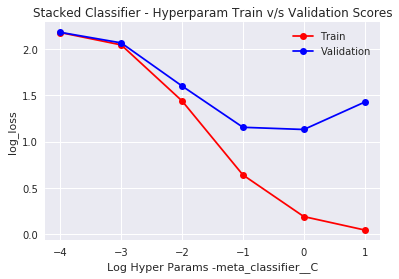

Best hyperparam value:  {'meta_classifier__C': 1.0} Best Train Score:  0.1898673561063251 Best Validation Score:  1.1317047499078143
2019-06-28 14:42:12.978008  Hyperparam Tuning of  Stacking Model completed


In [69]:
# declare model
base_models_list = [calib_mnb_clf, calib_lr_ubal_clf, calib_svc_clf]
param_dict_st = {'meta_classifier__C': [1e-04, 1e-03, 1e-02, 1e-01, 1e+00, 1e+01]}

print(datetime.now() ,' Hyperparam Tuning of  Stacking Model started')
hyp_tuned_info_st = get_best_hyperparam_StackedModel(param_dict_st, base_models_list, 
                                                     X_train, y_train, False)
print(datetime.now() ,' Hyperparam Tuning of  Stacking Model completed')

# separate out the fields
st_best_hyp, st_best_tr_score, st_best_val_score = hyp_tuned_info_st

### Train the classifier with best hyperparam value

In [70]:
meta_clf = LogisticRegression(C=st_best_hyp['meta_classifier__C'])
stacked_clf = StackingClassifier(classifiers=base_models_list, 
                                 meta_classifier=meta_clf, use_probas=True)
stacked_clf.fit(X_train, y_train)

# save model to disk
pickle_out = open("./model/stacked_clf.pkl","wb")
pickle.dump(stacked_clf, pickle_out)
pickle_out.close()

In [71]:
#load model from disk
pickle_in = open("./model/stacked_clf.pkl","rb")
stacked_clf = pickle.load(pickle_in)
pickle_in.close()

table_entry_st_train = evaluate_model(stacked_clf, X_train, y_train,
                                    title_suffix='Train',
                                    plot_fig=False)

Test Log loss value :  0.14837959548376797


<h3>4.7.1 testing with hyper parameter tuning</h3>

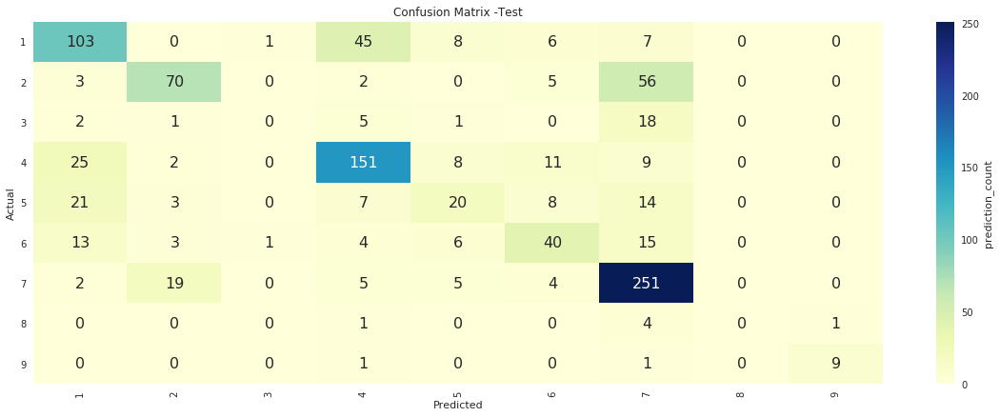

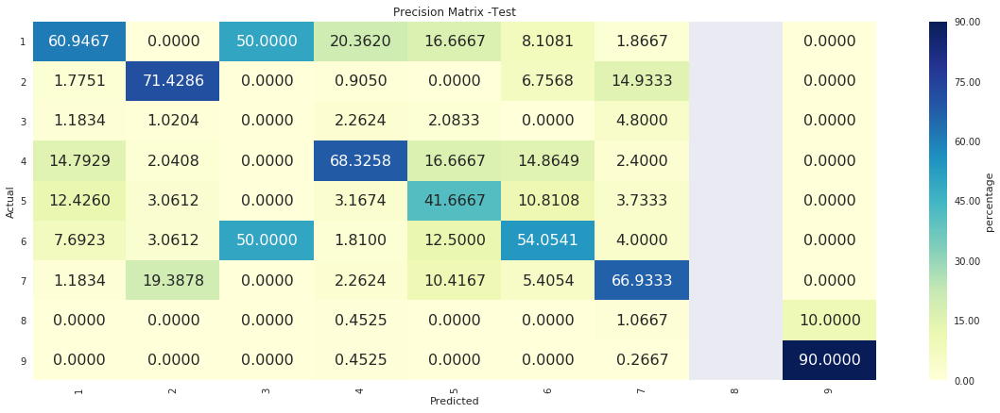

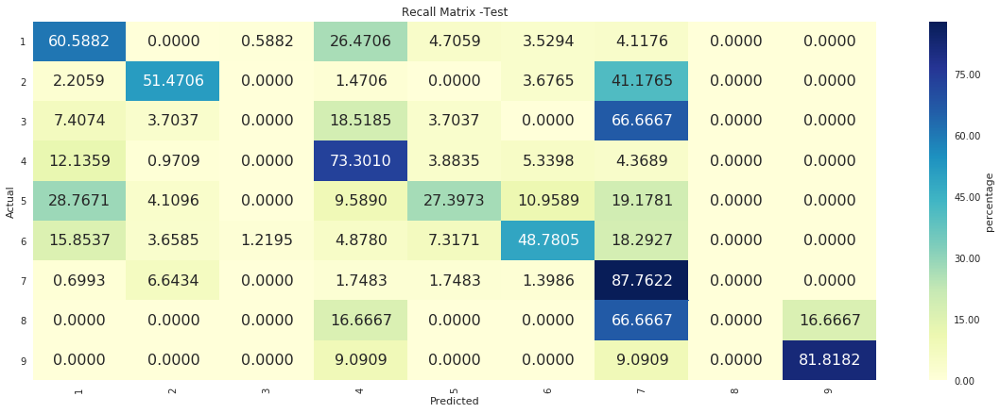

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


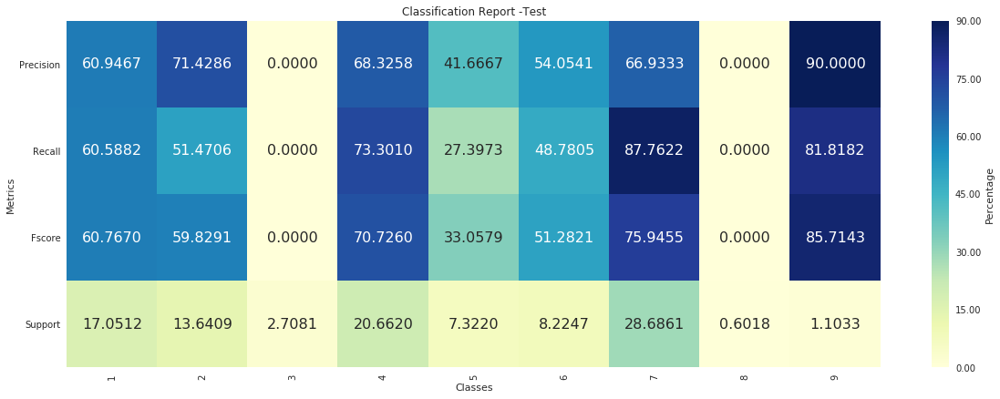

Test Log loss value :  1.1094697464067063


In [72]:
table_entry_st_test = evaluate_model(stacked_clf, X_test, y_test,
                                    title_suffix='Test',
                                    plot_fig=True)

In [73]:
table_entry_st =  ('Stacking Classifier', st_best_hyp,) + table_entry_st_train + table_entry_st_test

<h3>Observation</h3>
<ul>
<li> Model showed 0% f-score on rare classess 3, 8 </li>
</ul>

<h3>4.7.3 Maximum Voting classifier </h3>

In [74]:
voting_clf = VotingClassifier(estimators=[('svm', calib_svc_clf), ( 'mnb', calib_mnb_clf ), 
                                          ('lg', calib_lr_ubal_clf) ],
                              voting='soft')
voting_clf.fit(X_train, y_train)

# save model to disk
pickle_out = open("./model/voting_clf.pkl","wb")
pickle.dump(voting_clf, pickle_out)
pickle_out.close()

In [75]:
#load model from disk
pickle_in = open("./model/voting_clf.pkl","rb")
voting_clf = pickle.load(pickle_in)
pickle_in.close()

table_entry_voting_train = evaluate_model(voting_clf, X_train, y_train,
                                         title_suffix='Train',
                                         plot_fig=False)

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


Test Log loss value :  0.7468295368325896


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


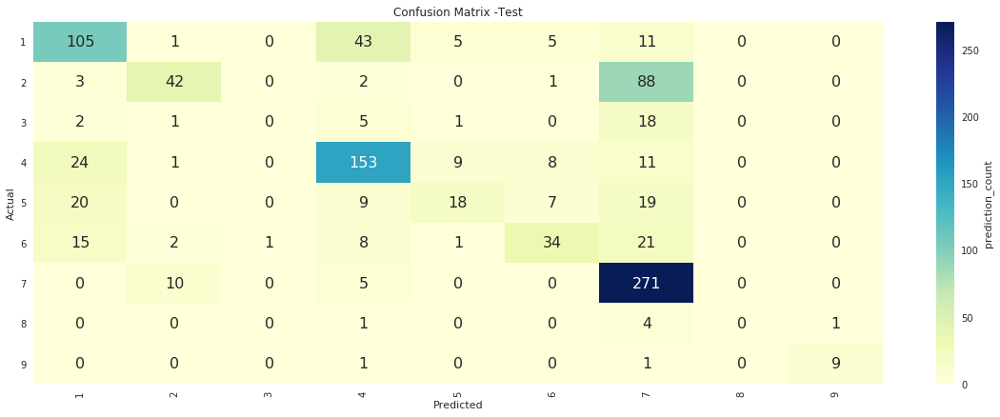

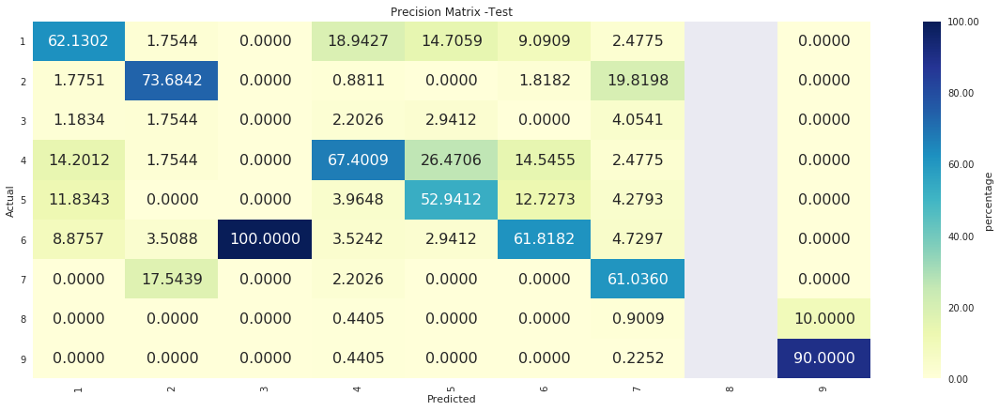

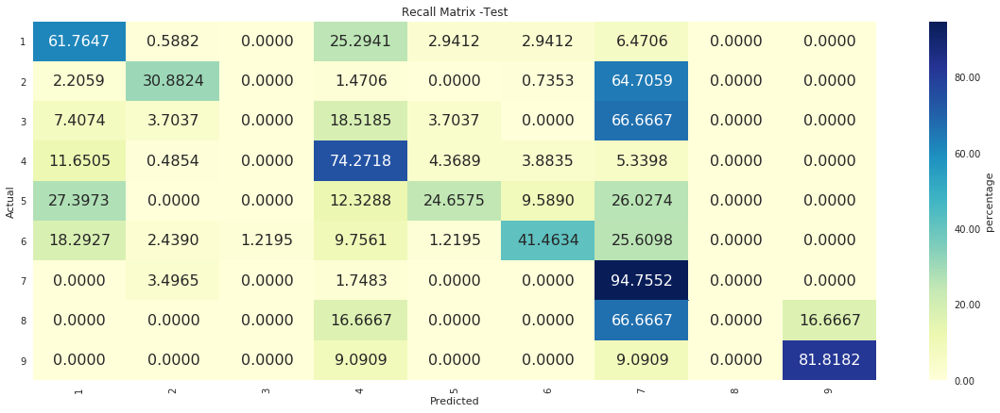

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


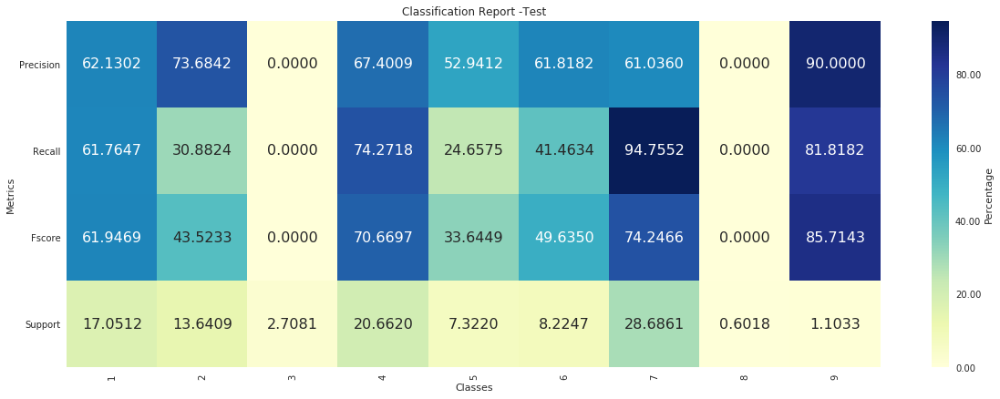

Test Log loss value :  1.1229817425161785


In [76]:
table_entry_voting_test = evaluate_model(voting_clf, X_test, y_test,
                                        title_suffix='Test',
                                        plot_fig=True)

In [77]:
table_entry_voting =  ('Voting Classifier', 'N/A',) + table_entry_voting_train + table_entry_voting_test

<h3> Observation </h3>
<ul>
<li> Model showed 0% f-score for rare class 3, 8</li>
</ul>

## Logistic Regression with BoW

In [78]:
df_train = pd.read_csv(bow_train_path, index_col=False)
df_test = pd.read_csv(bow_test_path, index_col=False)
df_train.head()

,abl1,acvr1,ago2,akt1,akt2,akt3,alk,apc,ar,araf,...,xl,year,years,yeast,yellow,yes,yet,zinc,Label,ID
0,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,8,0,7,837
1,0,0,0,0,0,0,0,0,0,0,...,1,0,1,8,2,0,2,8,1,493
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,7,1376
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,2,3283
4,0,0,0,0,0,0,0,0,0,0,...,1,13,8,0,1,5,0,0,7,2708


In [79]:
if (sample_size > 0):
    df_train = df_train.groupby(['Label']).apply(lambda x : 
                    x.sample(n=min(x.shape[0], sample_size )))
    df_train = df_train.reset_index(drop=True)
    df_test = df_test.groupby(['Label']).apply(lambda x : 
                    x.sample(n=min(x.shape[0], sample_size )))
    df_test = df_test.reset_index(drop=True)

# split the data to features & labels
X_train  = df_train.drop(['ID', 'Label'], axis=1)
y_train = df_train['Label']

# Evaluate the model on Test data
X_test = df_test.drop(['ID', 'Label'], axis=1)
y_test = df_test['Label']

print('Shape of train df', df_train.shape)
print('Shape of test df', df_test.shape)

feat_names_list = X_train.columns.values.tolist()

Shape of train df (2324, 5369)
Shape of test df (997, 5369)


<h3>4.3.1. With Class balancing</h3>

### Step 1. Find the best hyperparm values

2019-06-28 14:42:41.833553  Hyperparam Tuning of LogisticRegression started


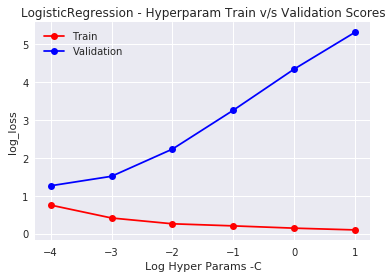

Best hyperparam value:  {'C': 0.0001} Best Train Score:  0.7525778460237224 Best Validation Score:  1.2641437244189144
2019-06-28 14:47:06.852414  Hyperparam Tuning of LogisticRegression completed


In [80]:
param_dict_lr_bal_bow = {'C':[1e-04, 1e-03, 1e-02, 1e-01, 1e-0, 1e+1]}
print(datetime.now() ,' Hyperparam Tuning of LogisticRegression started')
hyp_tuned_info_lr_bal_bow = get_best_hyperparam_LogisticRegression(param_dict_lr_bal_bow, 
                                                                   X_train, y_train, 
                                                                   random_search=False, 
                                                                   balanced=True)
print(datetime.now() ,' Hyperparam Tuning of LogisticRegression completed')

# separate out the fields
lr_bal_best_hyp_bow, lr_bal_best_tr_score_bow, lr_bal_best_val_score_bow = hyp_tuned_info_lr_bal_bow

In [81]:
lr_bal_clf_bow = LogisticRegression(C=lr_bal_best_hyp_bow['C'], class_weight='balanced')
calib_lr_bal_clf_bow = CalibratedClassifierCV(base_estimator=lr_bal_clf_bow, 
                                               method='sigmoid', cv=3)

### Step 2. Train the model with best hyperparam value

In [82]:
lr_bal_clf_bow.fit(X_train, y_train)
calib_lr_bal_clf_bow.fit(X_train, y_train)

# save model to disk
pickle_out = open("./model/logistic_regression_bal_bow.pkl","wb")
pickle.dump(calib_lr_bal_clf_bow, pickle_out)
pickle_out.close()

In [83]:
#load model from disk
pickle_in = open("./model/logistic_regression_bal_bow.pkl","rb")
calib_lr_bal_clf = pickle.load(pickle_in)
pickle_in.close()

table_entry_lr_balanced_train_bow = evaluate_model(calib_lr_bal_clf_bow, X_train, y_train,
                                              title_suffix='Train',
                                              plot_fig=False)

Test Log loss value :  0.8933995997862364


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Step 3. Evaluate the model on test data

In [84]:
table_entry_lr_balanced_test_bow = evaluate_model(calib_lr_bal_clf_bow, X_test, y_test,
                                              title_suffix='Train',
                                              plot_fig=False)

Test Log loss value :  1.1784701565738154


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [85]:
lr_bal_table_entry_bow = ('LR- BoW - Balanced', lr_bal_best_hyp_bow,) + \
          table_entry_lr_balanced_train_bow + table_entry_lr_balanced_test_bow

### Step 4 : Feature Importance

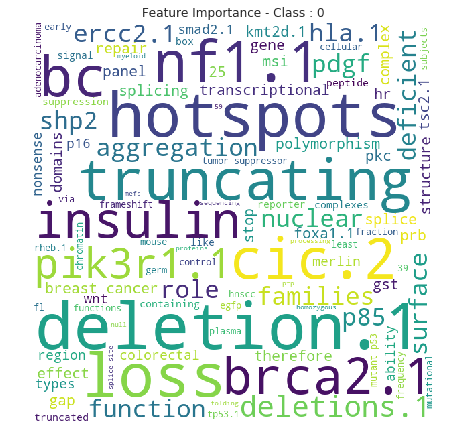

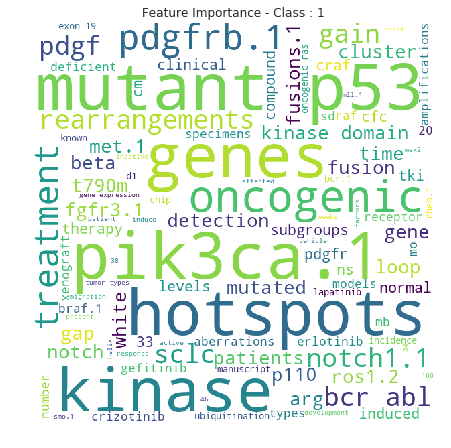

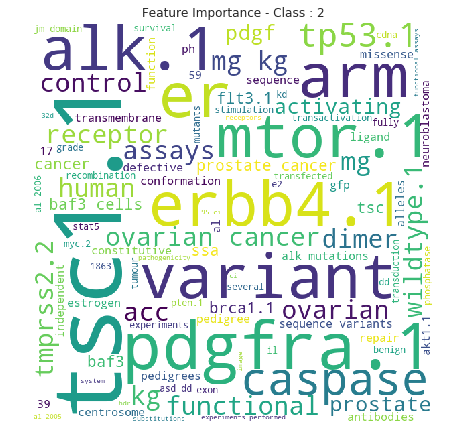

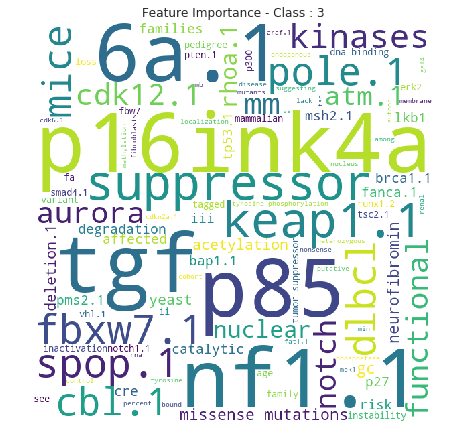

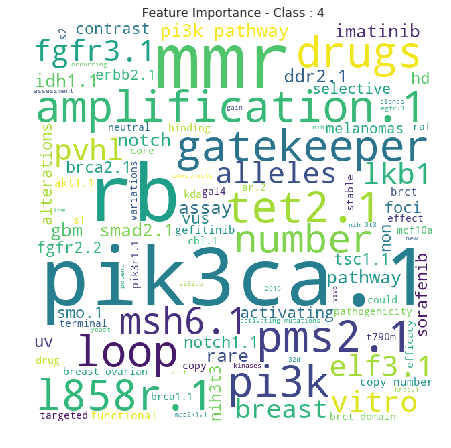

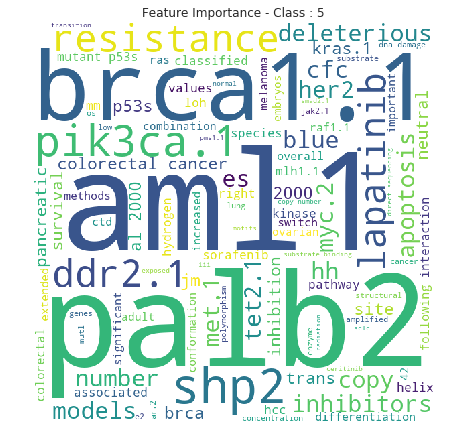

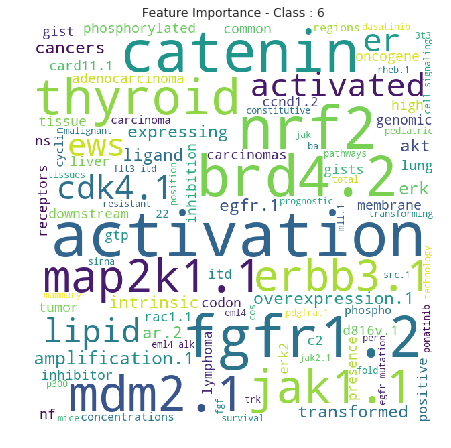

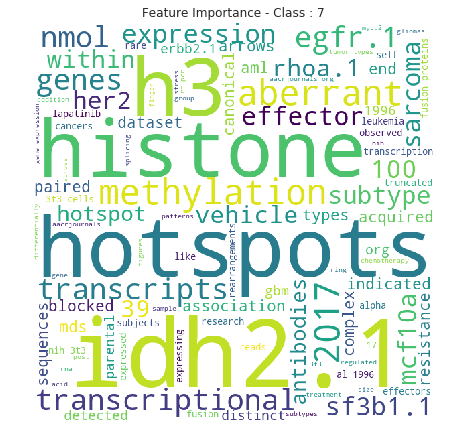

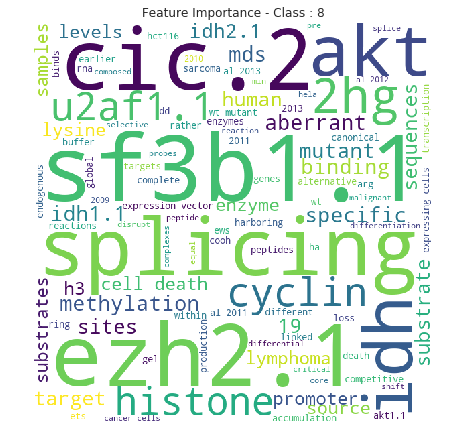

In [86]:
get_feature_importance(lr_bal_clf_bow, 100, feat_names_list)

<h3>4.3.2. Without Class balancing</h3>

### Step 1. Find the best hyperparm values

2019-06-28 14:47:30.097646  Hyperparam Tuning of LogisticRegression (ubal) started


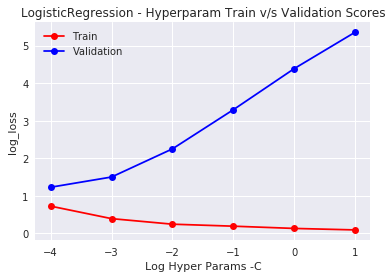

Best hyperparam value:  {'C': 0.0001} Best Train Score:  0.7254429191888004 Best Validation Score:  1.229173753413111
2019-06-28 14:52:11.080927  Hyperparam Tuning of LogisticRegression (ubal) completed


In [87]:
param_dict_lr_ubal_bow = {'C':[1e-04, 1e-03, 1e-02, 1e-01, 1e-0, 1e+1]}
print(datetime.now() ,' Hyperparam Tuning of LogisticRegression (ubal) started')
hyp_tuned_info_ubal_bow = get_best_hyperparam_LogisticRegression(param_dict_lr_ubal_bow, 
                                                                 X_train, y_train,
                                                                 random_search=False, 
                                                                 balanced=False)
print(datetime.now() ,' Hyperparam Tuning of LogisticRegression (ubal) completed')

# separate out the fields
lr_ubal_best_hyp_bow, lr_ubal_best_tr_score_bow, lr_ubal_best_val_score_bow = hyp_tuned_info_ubal_bow

In [88]:
lr_ubal_clf_bow = LogisticRegression(C=lr_ubal_best_hyp['C'], class_weight=None)
calib_lr_ubal_clf_bow = CalibratedClassifierCV(base_estimator=lr_ubal_clf_bow, 
                                               method='sigmoid', cv=3)

### Step 2. Train the model with best hyperparam value

In [89]:
lr_ubal_clf_bow.fit(X_train, y_train)
calib_lr_ubal_clf_bow.fit(X_train, y_train)

# save model to disk
pickle_out = open("./model/logistic_regression_ubal_bow.pkl","wb")
pickle.dump(calib_lr_ubal_clf_bow, pickle_out)
pickle_out.close()

In [90]:
#load model from disk
pickle_in = open("./model/logistic_regression_ubal_bow.pkl","rb")
calib_lr_ubal_clf_bow = pickle.load(pickle_in)
pickle_in.close()

table_entry_lr_ubal_train_bow = evaluate_model(calib_lr_ubal_clf_bow, X_train, y_train,
                                         title_suffix='Train',
                                         plot_fig=False)

Test Log loss value :  0.9350300587935849


/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Step 3. Evaluate the model on test data

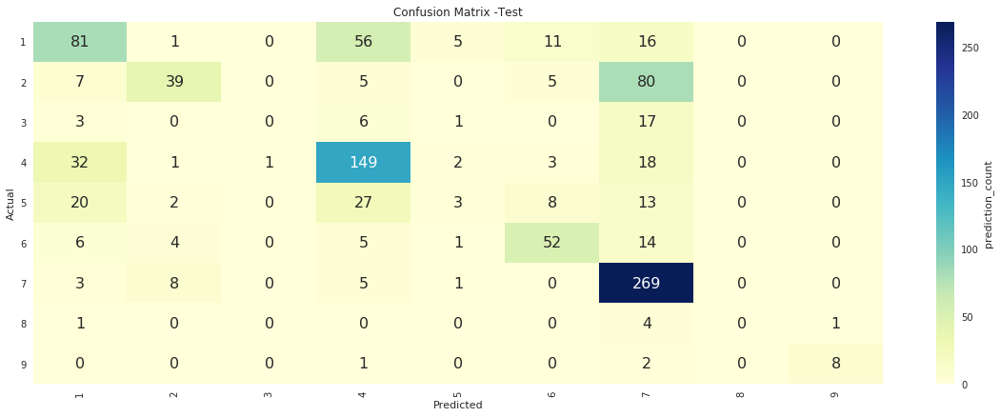

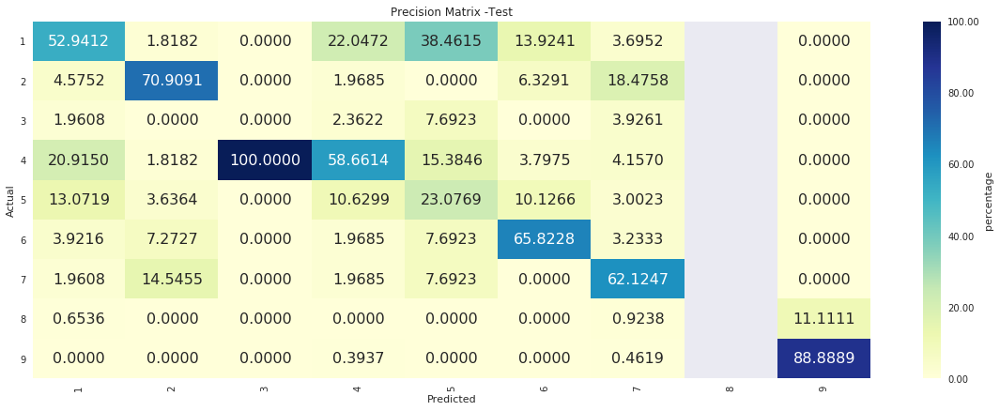

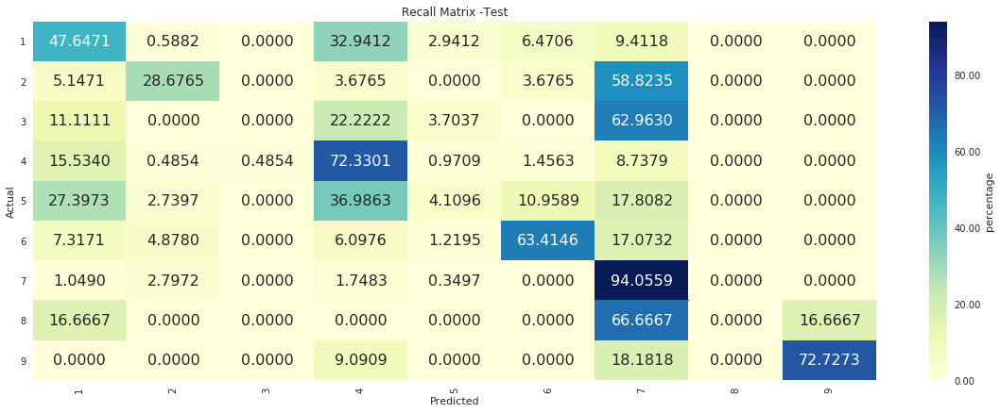

/home/amd_3/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


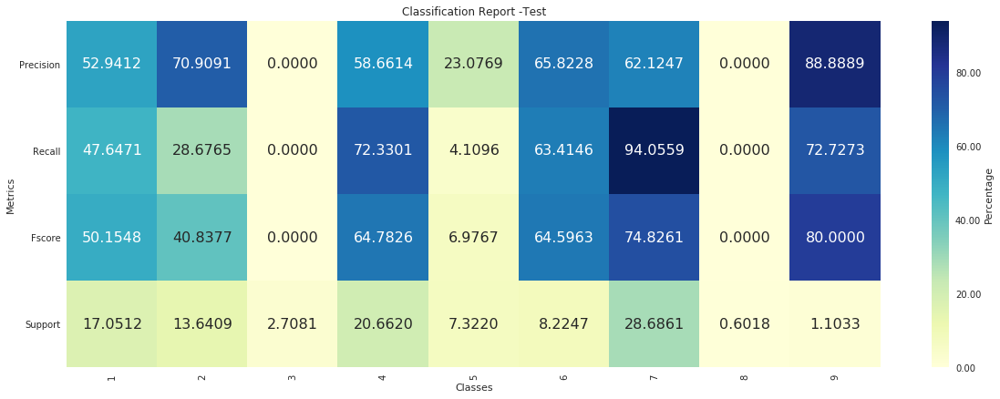

Test Log loss value :  1.2640868774021303


In [91]:
table_entry_lr_ubal_test_bow = evaluate_model(calib_lr_ubal_clf_bow, X_test, y_test,
                                         title_suffix='Test',
                                         plot_fig=True)

In [92]:
lr_ubal_table_entry_bow = ('LR - BoW - Imbalanced', lr_ubal_best_hyp_bow,) + \
            table_entry_lr_ubal_train_bow + table_entry_lr_ubal_test_bow

### Step 4. Feature Importance

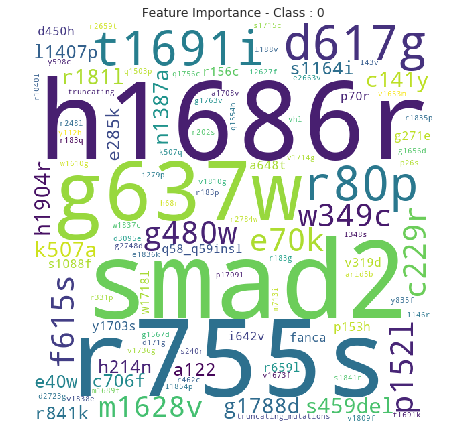

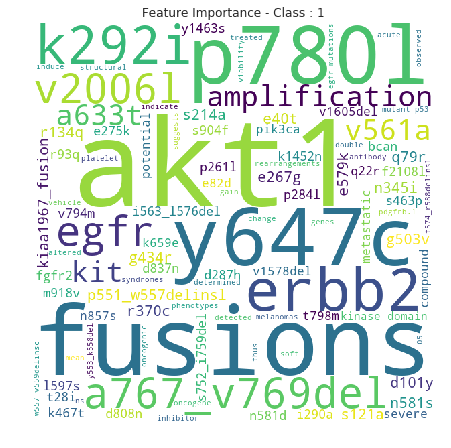

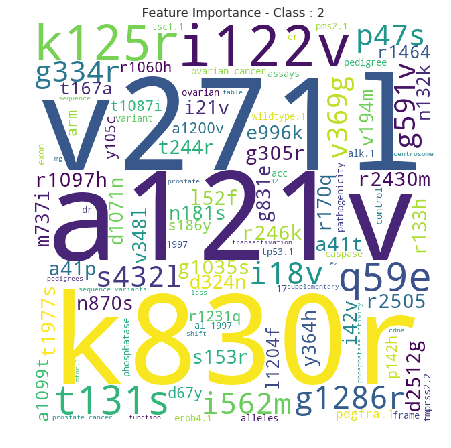

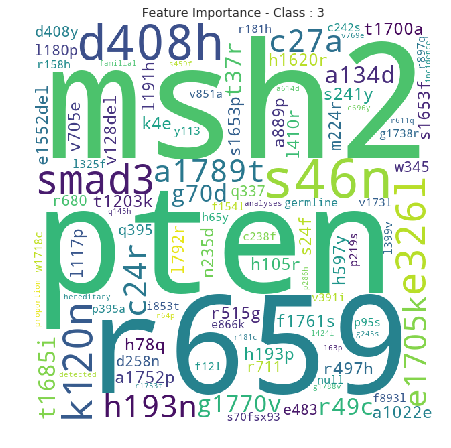

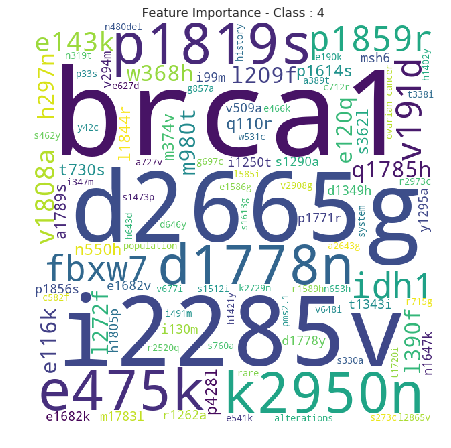

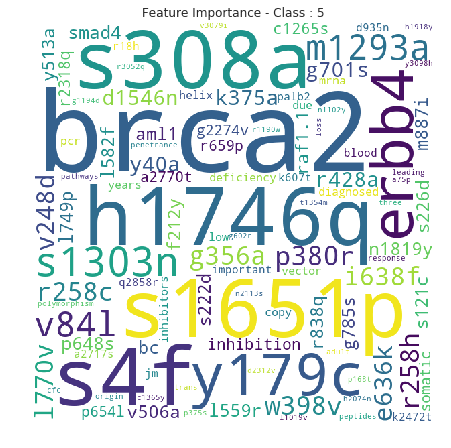

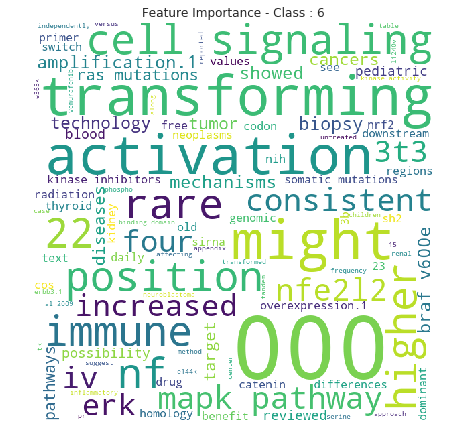

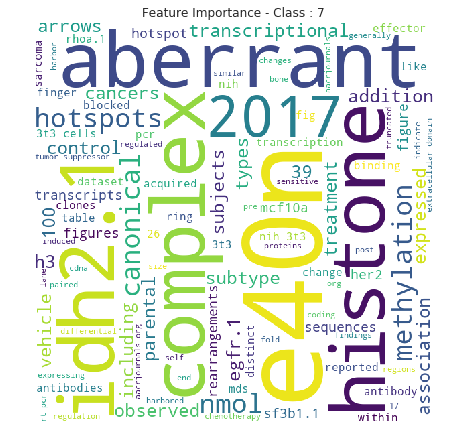

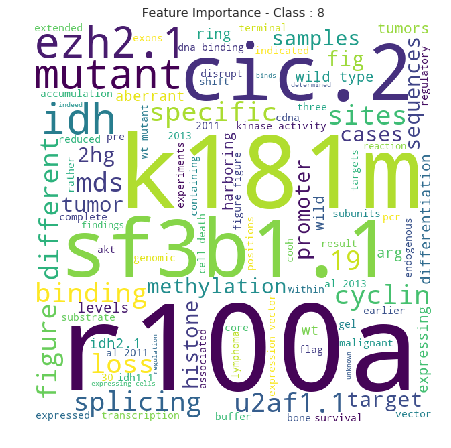

In [93]:
get_feature_importance(lr_ubal_clf_bow, 100, feat_names_list)

<h3> Observations </h3>
<ul>
<li> The model showed 0% -fscore for rare class 3, 8</li>
</ul>

# Results

In [94]:
Pret_table = PrettyTable()
Pret_table.field_names = ['Model', 'Hyperparam', 'Train Log Loss', 'Test Log Loss']
Pret_table.title = 'Classification Model Results Summary'

# add the model results
Pret_table.add_row(table_entry_knn)
Pret_table.add_row(mnb_table_entry)
Pret_table.add_row(lr_bal_table_entry)
Pret_table.add_row(lr_ubal_table_entry)
Pret_table.add_row(svc_table_entry)
Pret_table.add_row(rf_table_entry)
Pret_table.add_row(rf_res_table_entry)
Pret_table.add_row(table_entry_st)
Pret_table.add_row(table_entry_voting)
Pret_table.add_row(lr_bal_table_entry_bow)
Pret_table.add_row(lr_ubal_table_entry_bow)

print(Pret_table, '\n'*3)
print(datetime.now() ,' \n Done !!!')

+---------------------------------------------------------------------------------------------------------+
|                                   Classification Model Results Summary                                  |
+-----------------------+------------------------------------------------+----------------+---------------+
|         Model         |                   Hyperparam                   | Train Log Loss | Test Log Loss |
+-----------------------+------------------------------------------------+----------------+---------------+
|          KNN          |              {'n_neighbors': 35}               |     1.1816     |     1.2404    |
|     Multinomial-NB    |                {'alpha': 10.0}                 |     1.2465     |     1.2465    |
|      LR- Balanced     |                  {'C': 10.0}                   |     0.4406     |     1.0009    |
|     LR- Imbalanced    |                  {'C': 10.0}                   |     0.4351     |     1.0008    |
|       Linear-SVC      |   

# Procedure Summary

<ul>
<li> Features with 4-grams are used for building the model to reduce log loss </li>
<li> Hyperparameter tuning for all models done </li>
<li> Trained all the models with the corresponding best hyperparameter values</li>
<li> Evaluated both train, test metrics for all the models </li>
<li> Feature importances for each classess identified for models which are interprettable such as 
     Naiva bayes, Logistic Regression, Linear-SVM, Random Forest </li>
</ul>

# Conclusion

<li> The best model obtained from all the models tried is the Logistic Regression with TF-IDF dataset</li>
<li> The best model log loss is 1.0008 & 1.0009 for Logistic regression balanced, unbalanced respectvely </li>
<li> The random model log loss is 2.5 times higher than the best model </li>
<li> Models that used response encoded data did not perform well compared to the model that used 
     Bow features</li>
<li> More featue engineering works can be done other than the 4-grams to reduce log-loss further </li>
<li> Domain knowledge can be incorporated when extracting the feature to redce the log loss to much smaller  
     margin </li>
</ul>